## Load dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LightSource
from sklearn.preprocessing import QuantileTransformer 
import skgstat as skg
from skgstat import models
import gstatsim as gs
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.interpolate import RBFInterpolator
from scipy import ndimage

import matplotlib.colors as mcolors
import matplotlib as mpl

import sys
sys.path.append('/Users/jrines/stanford_gp/research/mx/computers_geosciences/geosoft')
from geosoft_cmap_k65 import *
geosoft_cmap = geosoft_cmap_k65()
ls = LightSource(azdeg=120, altdeg=45)
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize, LightSource

from joblib import Parallel, delayed
import time

import xarray as xr

import os

import os
import xarray as xr
from datetime import datetime

from skimage.measure import find_contours

from scipy.spatial import cKDTree




## Define MultiGrid functions

In [2]:
def multigrid_smpl(indata_xy_val, spacing, initial_band=0):
    """
    Fixed version that doesn't oversample
    """
    x_max, y_max = int(indata_xy_val[:,0].max()+1), int(indata_xy_val[:,1].max()+1)
    var_data = indata_xy_val[:,2].var()
    data_xy = indata_xy_val[:,:2].copy()
    
    # Don't override initial_band for small spacing
    if spacing < 3 and initial_band == 0:
        initial_band = 1  # Much smaller default
    
    var_rsmpl = 0
    coeff = 1.1
    count = 0
    best_sample = None
    
    while var_rsmpl < (var_data * coeff): 
        x_ = np.random.randint(0, spacing + initial_band)
        y_ = np.random.randint(0, spacing + initial_band)
        
        out_data_smpl = []
        sampled_indices = set()  # Track to avoid duplicates
        
        for x_i in range(x_, x_max, spacing):
            for y_i in range(y_, y_max, spacing):  # Fixed: use y_ not x_
                centr = np.r_[x_i, y_i]
                centr_nearest_data = np.linalg.norm(centr - data_xy, axis=1).argmin()
                
                # Avoid duplicates
                if centr_nearest_data not in sampled_indices:
                    sampled_indices.add(centr_nearest_data)
                    out_data_smpl.append(indata_xy_val[centr_nearest_data])
        
        d_rsmpl = np.asarray(out_data_smpl)
        var_rsmpl = d_rsmpl[:,2].var() if len(d_rsmpl) > 1 else 0
        
        # Keep the best sample so far
        if best_sample is None or len(d_rsmpl) > len(best_sample):
            best_sample = d_rsmpl.copy()
        
        count += 1
        if count > spacing*20:
            coeff = 1
        if count > spacing*50:
            coeff = 0.95
        if count > spacing*75:
            coeff = 0.90
        if count > spacing*100:
            coeff = 0.80
        if count > spacing*125:
            coeff = 0.70
        if count > spacing*150:
            break
    
    return best_sample if best_sample is not None else d_rsmpl


def subsample_dataframe(df, column_for_sampling='value', spacing=5, initial_band=0):
    """
    Subsample a dataframe using the multigrid_smpl function
    
    Parameters:
    df: DataFrame with x, y, and value columns
    column_for_sampling: which column to use for the sampling variance criteria
    spacing: spacing parameter for multigrid_smpl
    initial_band: initial_band parameter for multigrid_smpl
    
    Returns:
    DataFrame: subsampled dataframe
    """
    # Convert dataframe to the required numpy array format [x, y, val]
    indata_xy_val = df[['x', 'y', column_for_sampling]].values
    
    # Apply the multigrid sampling
    sampled_array = multigrid_smpl(indata_xy_val, spacing, initial_band)
    
    # Convert back to dataframe format
    # Get the indices of the sampled points in the original dataframe
    sampled_indices = []
    for sampled_point in sampled_array:
        # Find the index in original dataframe that matches this sampled point
        mask = (df['x'] == sampled_point[0]) & (df['y'] == sampled_point[1]) & (df[column_for_sampling] == sampled_point[2])
        idx = df[mask].index
        if len(idx) > 0:
            sampled_indices.append(idx[0])
    
    # Return the subsampled dataframe with all original columns
    df_subsampled = df.loc[sampled_indices].copy().reset_index(drop=True)
    
    return df_subsampled

def stratified_sample(xy_val, strata_labels, choice_per_strata):
    
    data_var,smpl_var = xy_val[:,2].var(), 0
    
     # stratified sample 
    n_count = 0
    while smpl_var<=0.98*data_var:
        xy_val_random = []
        for label in np.unique(strata_labels):
            n_data = len(strata_labels[strata_labels==label])
            xy_label = np.copy(xy_val[strata_labels==label])

            if choice_per_strata > n_data:
                choice_per_strata = n_data

            xy_rand_index = np.random.choice(np.arange(n_data), 
                                             choice_per_strata, replace=False)

            xy_val_random.append(xy_label[xy_rand_index][0])    
        xy_val_random = np.asarray(xy_val_random) 
        # variance of the sampled data
        smpl_var = xy_val_random[:,2].var()
        n_count += 1
        if n_count>50:
            break
#     print(smpl_var/data_var)
#     print(n_count)
    return xy_val_random[:,:3].astype(int)


# def mgsim(mg_resols, df_grid, df_obspts, df_gamma, xx='x', yy='y', zz='residual', kk='id', num_points=10, radius=40):
    
#     # make defensive copies of dataframes
#     dfcp_grid = df_grid.copy()
#     dfcp_obspts = df_obspts.copy()

#     # define the locations of simulation (grid and observation points)
#     pred_xy_grid = dfcp_grid[['x','y']].values
#     pred_xy_obspts = dfcp_obspts[['x','y']].values

#     # compute initial residual
#     dfcp_obspts['residual'] = dfcp_obspts['value'] - dfcp_obspts['trend']

#     for (i,mg_resol) in enumerate(mg_resols):
#         print(f"MultiGrid iteration {i+1}: Processing resolution {mg_resol}")
        
#         # mg sample residuals at set resolution
#         df_mgsmpl = subsample_dataframe(dfcp_obspts, column_for_sampling='residual', spacing=mg_resol)
        
#         # sequential gaussian simulation of residuals subset
#         mgsgs_grid = gs.Interpolation.cluster_sgs(pred_xy_grid, df_mgsmpl, xx, yy, zz, kk, num_points, df_gamma, radius)            # gives numpy array of simulated values at specified locations (grid)
#         mgsgs_obspts = gs.Interpolation.cluster_sgs(pred_xy_obspts, df_mgsmpl, xx, yy, zz, kk, num_points, df_gamma, radius)        # gives numpy array of simulated values at specified locations (obspts)

#         # update trend on grid and obspts (trend = trend + simulated_residuals)
#         dfcp_grid['trend'] = dfcp_grid['trend'] + mgsgs_grid
#         dfcp_obspts['trend'] = dfcp_obspts['trend'] + mgsgs_obspts

#         # update residuals on obspts (residuals = data - trend)
#         dfcp_obspts['residual'] = dfcp_obspts['value'] - dfcp_obspts['trend']


#     return dfcp_grid, dfcp_obspts



def mgsim(mg_resols, df_xyvtcs, df_gamma, xx='x', yy='y', zz='residual', kk='cluster', num_points=10, radius=40):
    
    # make defensive copy of dataframe
    df = df_xyvtcs.copy()

    # define the locations of simulation (grid and observation points)
    pred_xy_grid = df[['x','y']].values

    # compute initial residual
    df['residual'] = df['value'] - df['trend']

    # initialize a 'newtrend' column
    df['newtrend'] = df['trend'].copy()

    # loop over resolutions
    for (i,mg_resol) in enumerate(mg_resols):
        print(f"MultiGrid iteration {i+1}: Processing resolution {mg_resol}")

        # get sub-dataframe just at observation points ('set' column = 1)
        df_obspts = df[df['set'] == 1].copy()
        
        # mg sample residuals at set resolution
        df_mgsmpl = subsample_dataframe(df_obspts, column_for_sampling='residual', spacing=mg_resol)
        
        # sequential gaussian simulation of residuals subset
        mgsgs = gs.Interpolation.cluster_sgs(pred_xy_grid, df_mgsmpl, xx, yy, zz, kk, num_points, df_gamma, radius)

        # update trend on grid and obspts (trend = trend + simulated_residuals)
        df['newtrend'] = df['newtrend'] + mgsgs # NOTE THIS MAYBRE WE COULD MAKE MORE ROBUST TO ENSURE THAT WE ARE ADDING THE RIGHT SIMULATED VALUE AT THE RIGHT LOCATION TO THE TREND THERE

        # update residuals on obspts (residuals = data - trend)
        df['residual'] = df['value'] - df['newtrend']


    return df



## Load and plot data

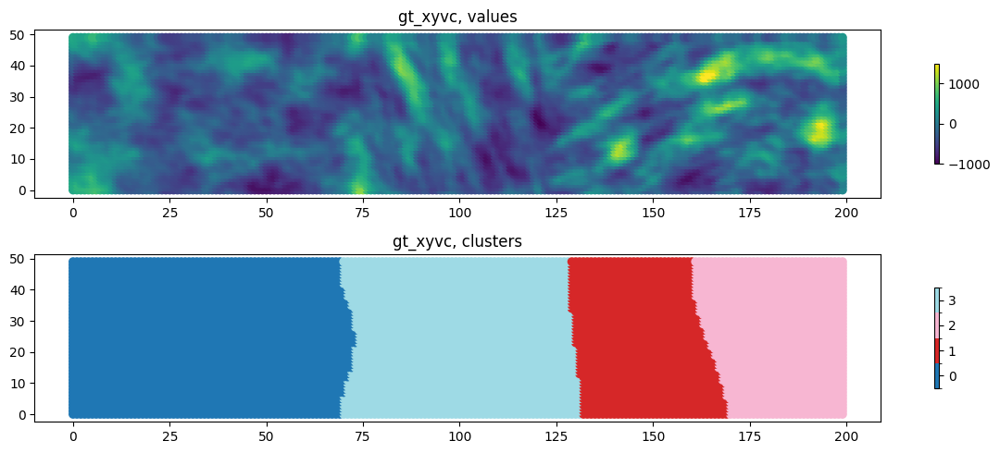

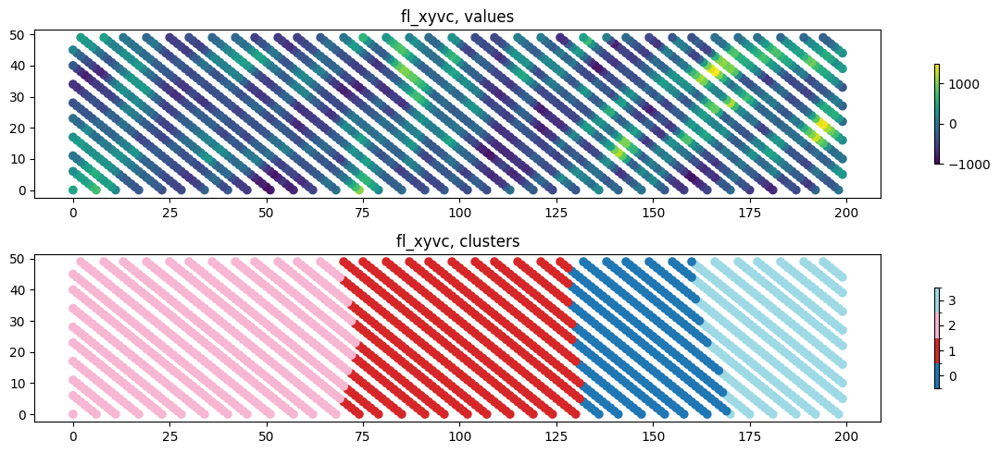

In [3]:
## LOAD AND PLOT GROUND TRUTH AND  ##
## ========================================== ##

# GROUND TRUTH
df_gt_xyvc = pd.read_csv('/Users/jrines/stanford_gp/research/mx/computers_geosciences/data/gt_xyvc.csv')
gt_xyvc = df_gt_xyvc.values

# FLIGHT LINES
df_fl_xyvc = pd.read_csv('/Users/jrines/stanford_gp/research/mx/computers_geosciences/data/fl_xyvc.csv')
fl_xyvc = df_fl_xyvc.values


# get number of clusters from gt_xyvc
regions = gt_xyvc[:, 3]
unique_regions = np.unique(regions)
n_regions = len(unique_regions)
# set plot characteristics based on region clustering from gt_xyvc
cmap = plt.colormaps["tab20"].resampled(n_regions)
norm = mcolors.BoundaryNorm(
    boundaries=np.arange(-0.5, n_regions+0.5, 1),
    ncolors=n_regions
)

# plot ground truth and clustering
plt.figure(figsize=(12,5))
plt.subplot(2, 1, 1)
plt.scatter(gt_xyvc[:,0], gt_xyvc[:,1], c=gt_xyvc[:,2])
plt.title(f"gt_xyvc")
plt.colorbar(shrink=0.6)
plt.clim(-1000, 1500)
plt.title("gt_xyvc, values")
plt.subplot(2, 1, 2)
plt.scatter(gt_xyvc[:,0], gt_xyvc[:,1], c=gt_xyvc[:,3], cmap=cmap, norm=norm)
plt.title(f"gt_xyvc, clusters")
plt.colorbar(shrink=0.6, ticks=np.arange(n_regions))
plt.tight_layout()

# plot flight lines and clustering
plt.figure(figsize=(12,5))
plt.subplot(2, 1, 1)
plt.scatter(fl_xyvc[:,0], fl_xyvc[:,1], c=fl_xyvc[:,2])
plt.title(f"fl_xyvc")
plt.colorbar(shrink=0.6)
plt.clim(-1000, 1500)
plt.title("fl_xyvc, values")
plt.subplot(2, 1, 2)
plt.scatter(fl_xyvc[:,0], fl_xyvc[:,1], c=fl_xyvc[:,3], cmap=cmap, norm=norm)
plt.title(f"fl_xyvc, clusters")
plt.colorbar(shrink=0.6, ticks=np.arange(n_regions))
plt.tight_layout()


## Generate trend(s)

In [8]:
## DEFINE make_trend() FUNCTION ##
## ============================ ##


def make_trend(fl_xyvc, grid_xyc, smoothing):

    # agglomerative clustering
    DistanceThreshold = 4 #(half of line space)
    LinkageType = 'average'
    clusteringProgram = AgglomerativeClustering(n_clusters=None, 
                                                #  affinity='euclidean', 
                                                connectivity=None,
                                                linkage=LinkageType,
                                                distance_threshold = DistanceThreshold).fit(fl_xyvc[:,:2])
    labels = clusteringProgram.labels_
    clusterAmount = clusteringProgram.n_clusters_
    stratified_xyv = stratified_sample(xy_val=fl_xyvc, strata_labels=labels, choice_per_strata=1)

    # get x, y, val from stratified sample
    x_stratified = stratified_xyv[:, 0]  # x values
    y_stratified = stratified_xyv[:, 1]  # y values
    val_stratified = stratified_xyv[:, 2]  # values

    # Prepare data for RBF
    data_points = np.column_stack((x_stratified, y_stratified))

    # RBF Interpolation using thin plate spline
    rbf = RBFInterpolator(data_points, val_stratified, kernel='thin_plate_spline', smoothing=smoothing)

    # Interpolate onto the exact same grid points as df_mcgrid
    grdpts = grid_xyc[:, :2]   # (N, 2)
    obspts = fl_xyvc[:, :2]    # (M, 2)
    rbf_values_grdpts = rbf(grdpts)
    rbf_values_obspts = rbf(obspts)

    # add trend values to xyvc arrays on grid points and observation points
    grid_xyct = np.column_stack([grid_xyc, rbf_values_grdpts])
    fl_xyvct = np.column_stack([fl_xyvc, rbf_values_obspts])

    return fl_xyvct, grid_xyct



In [9]:
## USE make_trend() TO MAKE A TREND ##
## ================================ ##

# define the grid and fl_xyvc
grid_xyc = np.column_stack([gt_xyvc[:, :2], gt_xyvc[:, 3]]) # isolate just the grid points and cluster id columns (get rid of values column)
fl_xyvc = fl_xyvc

# make the trend (note this will be different trend each time the function is called, due to sampling in the make_trend() function)
smoothing = 1.0
fl_xyvct, grid_xyct = make_trend(fl_xyvc, grid_xyc, smoothing)


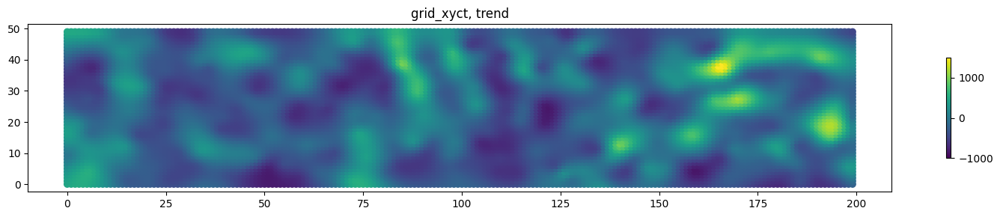

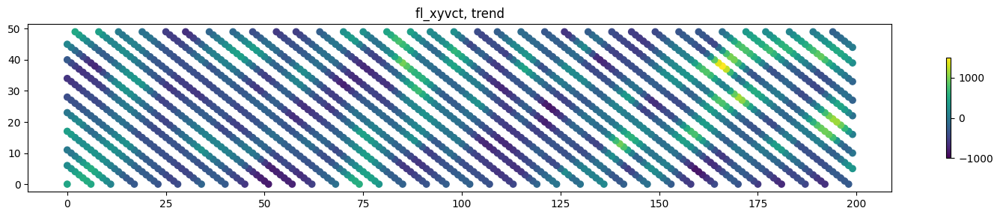

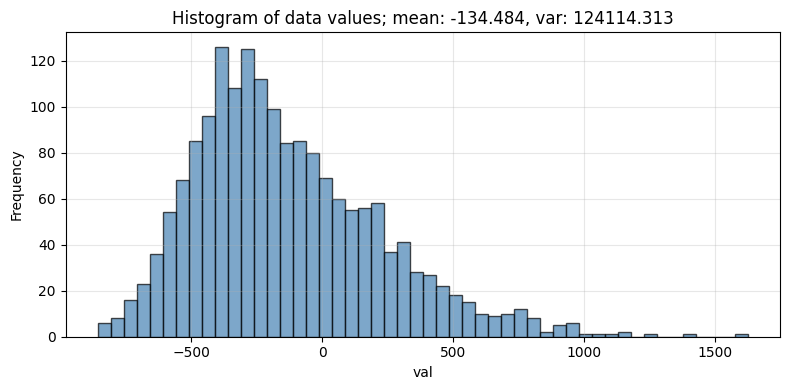

In [10]:
## PLOT TREND ##
## ========== ##

# plot trend on grid points
plt.figure(figsize=(15,3))
plt.scatter(grid_xyct[:,0], grid_xyct[:,1], c=grid_xyct[:,3])
plt.title(f"grid_xyct, trend")
plt.colorbar(shrink=0.6)
plt.clim(-1000, 1500)
plt.tight_layout()

# plot trend on observation points (flight lines)
plt.figure(figsize=(15,3))
plt.scatter(fl_xyvct[:,0], fl_xyvct[:,1], c=fl_xyvct[:,4])
plt.title(f"fl_xyvct, trend")
plt.colorbar(shrink=0.6)
plt.clim(-1000, 1500)
plt.tight_layout()

# Histogram of flightline data
plt.figure(figsize=(8, 4))
residuals = fl_xyvct[:, 4]
plt.hist(residuals, bins=50, color="steelblue", edgecolor="k", alpha=0.7)
plt.title(f"Histogram of data values; mean: {fl_xyvct[:,4].mean():.3f}, var: {fl_xyvct[:,4].var():.3f}")
plt.xlabel("val")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## Compute residuals (and add to fl_xyvct array for fl_xyvctr)

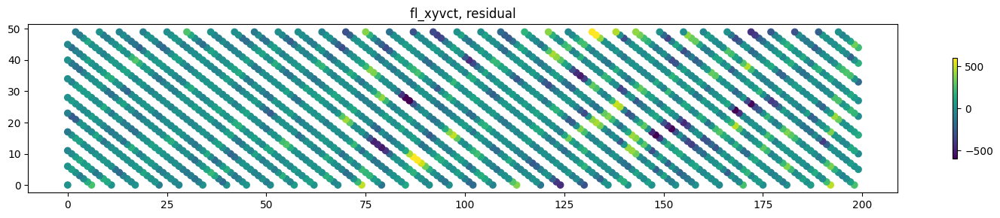

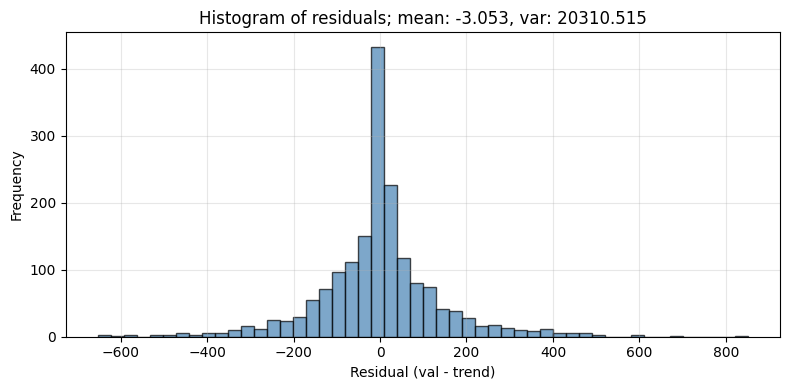

In [11]:
## COMPUTE RESIDUALS AND ADD TO ARRAY ##
## ================================== ##

# val is col 2, trend is col 4
residuals = fl_xyvct[:, 2] - fl_xyvct[:, 4]

# add as new column
fl_xyvctr = np.column_stack([fl_xyvct, residuals])

# plot residuals (only exist on observation points)
plt.figure(figsize=(15,3))
plt.scatter(fl_xyvctr[:,0], fl_xyvctr[:,1], c=fl_xyvctr[:,5])
plt.title(f"fl_xyvct, residual")
plt.colorbar(shrink=0.6)
plt.clim(-600, 600)
plt.tight_layout()
plt.show()

# Histogram of residuals
plt.figure(figsize=(8, 4))
residuals = fl_xyvctr[:, 5]
plt.hist(residuals, bins=50, color="steelblue", edgecolor="k", alpha=0.7)
plt.title(f"Histogram of residuals; mean: {fl_xyvctr[:,5].mean():.3f}, var: {fl_xyvctr[:,5].var():.3f}")
plt.xlabel("Residual (val - trend)")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



## FIGURE FOR PAPER

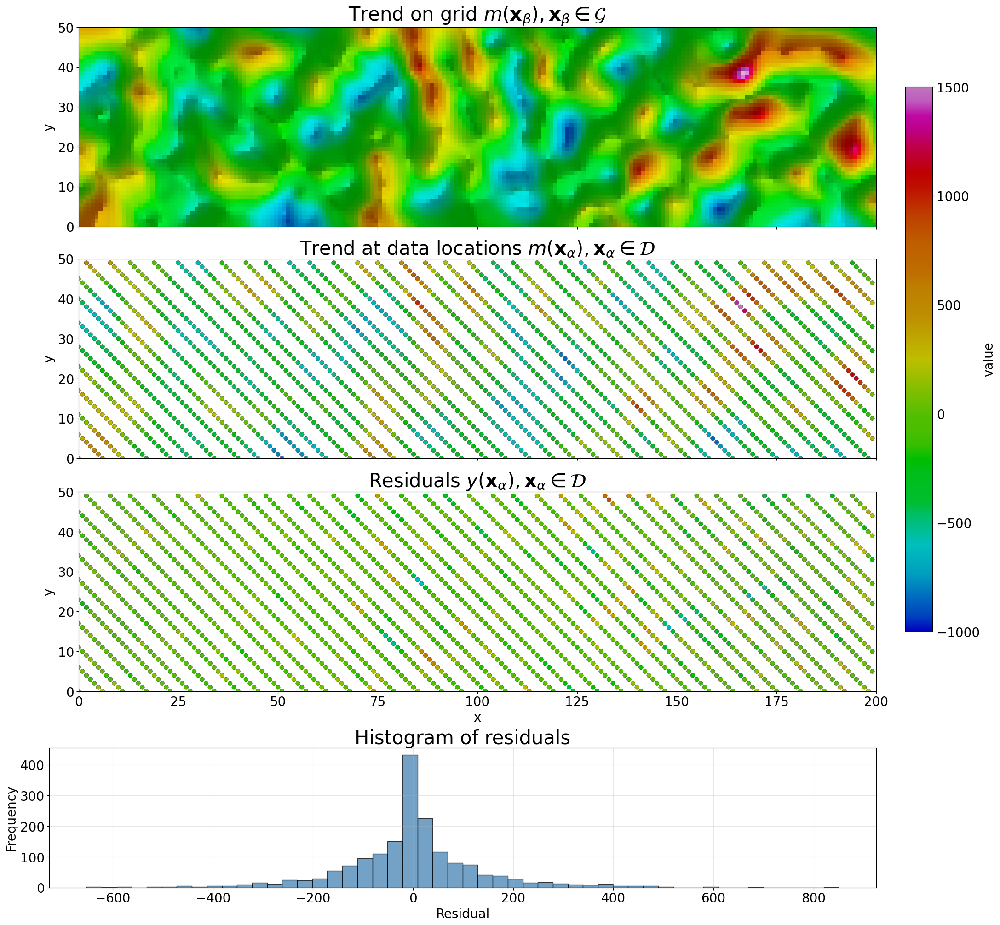

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib.gridspec as gridspec

# ------------ inputs -------------
# grid_xyct: columns [x, y, cluster, trend]
# fl_xyvct : columns [x, y, val, cluster, trend]
# ls, geosoft_cmap are defined elsewhere

# ---- style / limits ----
xmin, xmax = 0, 200
ymin, ymax = 0, 50
xticks = np.arange(0, 201, 25)
yticks = np.arange(0,  51, 10)

trend_vmin, trend_vmax = -1000, 1500
trend_norm = Normalize(vmin=trend_vmin, vmax=trend_vmax)

plt.rcParams.update({
    "axes.titlesize": 30,
    "axes.labelsize": 20,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 20,
})

# ---- build gridded trend raster from grid_xyct ----
x_unique = np.unique(grid_xyct[:, 0]); x_unique.sort()
y_unique = np.unique(grid_xyct[:, 1]); y_unique.sort()
nx, ny   = len(x_unique), len(y_unique)

trend_vals  = grid_xyct[:, 3]
trend_grid  = trend_vals.reshape(ny, nx)

# Light-shaded RGB of the trend
trend_rgb = ls.shade(
    trend_grid, cmap=geosoft_cmap, blend_mode='soft',
    vmin=trend_vmin, vmax=trend_vmax
)

# ---- flightline arrays + residuals ----
fl_x, fl_y = fl_xyvct[:, 0], fl_xyvct[:, 1]
fl_val     = fl_xyvct[:, 2]
fl_trend   = fl_xyvct[:, 4]
fl_resid   = fl_val - fl_trend

# ---------------- figure layout ----------------
fig = plt.figure(figsize=(22, 20), constrained_layout=True)

gs = gridspec.GridSpec(
    4, 2, figure=fig,
    width_ratios=[60, 1],
    height_ratios=[1, 1, 1, 0.7],
)

# Main panels (share axes so they align perfectly)
ax_top  = fig.add_subplot(gs[0, 0])
ax_mid  = fig.add_subplot(gs[1, 0], sharex=ax_top, sharey=ax_top)
ax_bot  = fig.add_subplot(gs[2, 0], sharex=ax_top, sharey=ax_top)

# Histogram panel (same left-column width)
ax_hist = fig.add_subplot(gs[3, 0])

# ---------------- (0) TOP: shaded trend raster ----------------
ax_top.imshow(
    trend_rgb, origin='lower',
    extent=[xmin, xmax, ymin, ymax],
    interpolation='nearest'
)
ax_top.set_title(r'Trend on grid $m(\mathbf{x}_\beta), \mathbf{x}_\beta\in\mathcal{G}$')

# ---------------- (1) MIDDLE: trend at flightline locations ----------------
ax_mid.scatter(
    fl_x, fl_y, c=fl_trend,
    cmap=geosoft_cmap, norm=trend_norm,
    s=50, edgecolors='k', linewidths=0.25, rasterized=True
)
ax_mid.set_title(r'Trend at data locations $m(\mathbf{x}_\alpha), \mathbf{x}_\alpha\in\mathcal{D}$')

# ---------------- (2) BOTTOM: residuals at flightline locations ----------------
# Use SAME colormap & limits as top for direct comparability
ax_bot.scatter(
    fl_x, fl_y, c=fl_resid,
    cmap=geosoft_cmap, norm=trend_norm,
    s=50, edgecolors='k', linewidths=0.25, rasterized=True
)
ax_bot.set_title(r'Residuals $y(\mathbf{x}_\alpha), \mathbf{x}_\alpha\in\mathcal{D}$')
ax_bot.set_xlabel('x')

# ---------------- Single shared colorbar (shorter height, still aligned) ----------------
m_trend = ScalarMappable(norm=trend_norm, cmap=geosoft_cmap)
m_trend.set_array([])

# Attach to the three main axes; shrink<1 reduces height while keeping alignment
cb = fig.colorbar(
    m_trend, ax=[ax_top, ax_mid, ax_bot],
    location="right", pad=0.02, shrink=0.82, fraction=0.045
)
cb.set_label('value')

# ---------------- (3) HISTOGRAM: residuals ----------------
mu, var = float(np.mean(fl_resid)), float(np.var(fl_resid))
ax_hist.hist(fl_resid, bins=50, color="steelblue", edgecolor="k", alpha=0.75)
ax_hist.set_title(f"Histogram of residuals")
ax_hist.set_xlabel("Residual")
ax_hist.set_ylabel("Frequency")
ax_hist.grid(alpha=0.3)

# ---------------- common axes formatting ----------------
for ax in (ax_top, ax_mid, ax_bot):
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_aspect('equal', adjustable='box')
    ax.set_xticks(xticks)
    ax.set_yticks(yticks)

# Hide x tick labels on top two panels for cleanliness
plt.setp(ax_top.get_xticklabels(), visible=False)
plt.setp(ax_mid.get_xticklabels(), visible=False)

ax_top.set_ylabel('y')
ax_mid.set_ylabel('y')
ax_bot.set_ylabel('y')

# IMPORTANT: Do NOT manually resize ax_hist; GridSpec keeps it same width as panels.



# save to PNG (high resolution, transparent background, trimmed)
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/trend_resids_synth_histogram.png",
    dpi=300, bbox_inches="tight", transparent=True
)


plt.show()


## Create DataFrame for flightline information

In [12]:
## PACK FLIGHTLINE INFO AND GRID INFO INTO ##
##  DATAFRAMES FOR GStatSim COMPATIBILITY  ##
## ======================================= ##

df_fl_xyvctr = pd.DataFrame(
    fl_xyvctr,
    columns=["x", "y", "value", "cluster", "trend", "residual"]
)

df_grid_xyct = pd.DataFrame(
    grid_xyct,
    columns=["x", "y", "cluster", "trend"]
)

print("flightline DataFrame")
print(df_fl_xyvctr.head())
print("\ngrid DataFrame")
print(df_grid_xyct.head())


flightline DataFrame
      x    y       value  cluster       trend    residual
0   0.0  0.0  474.224075      0.0  474.194063    0.030012
1   6.0  0.0  749.593665      0.0  497.192659  252.401006
2  11.0  0.0  131.113667      0.0  128.307570    2.806097
3  17.0  0.0 -270.998116      0.0 -293.997459   22.999343
4  23.0  0.0 -432.319171      0.0 -341.852114  -90.467057

grid DataFrame
     x    y  cluster       trend
0  0.0  0.0      0.0  474.194063
1  1.0  0.0      0.0  497.519139
2  2.0  0.0      0.0  517.571122
3  3.0  0.0      0.0  530.878765
4  4.0  0.0      0.0  534.114956


In [13]:
## AUGMENT DATAFRAME TO INCLUDE OBSERVATION POINT SET INFORMATION ##
## ============================================================== ##

# --- config ---
xcol, ycol, vcol = "x", "y", "value"
tol = 1e-8  # tolerance to match obs to grid

# --- build KDTree to map flightline points -> grid nodes ---
grid_xy = df_grid_xyct[[xcol, ycol]].to_numpy()
obs_xy  = df_fl_xyvctr[[xcol, ycol]].to_numpy()
obs_val = df_fl_xyvctr[vcol].to_numpy()

tree = cKDTree(grid_xy)
dist, gi = tree.query(obs_xy, distance_upper_bound=tol)  # gi==len(grid_xy) if no match
valid = np.isfinite(dist) & (gi >= 0) & (gi < len(grid_xy))

# --- start from grid; create df_xyvtcs with desired columns and dtypes ---
df_xyvtcs = df_grid_xyct.copy()

# ensure required columns exist with appropriate dtypes
if "trend" not in df_xyvtcs.columns:
    df_xyvtcs["trend"] = np.nan
if "cluster" not in df_xyvtcs.columns:
    df_xyvtcs["cluster"] = np.nan

df_xyvtcs["set"] = np.zeros(len(df_xyvtcs), dtype=np.int8)  # replaces grd_obs

# 🔁 change: initialize non-observation points as NaN
df_xyvtcs[vcol] = np.nan  # ensures float dtype and NaNs for non-obs nodes

# --- handle duplicates: average obs that hit the same grid node ---
matched = pd.DataFrame({"grid_idx": gi[valid].astype(int), vcol: obs_val[valid]})
agg = matched.groupby("grid_idx", as_index=False)[vcol].mean()

# --- assign values and flags ---
df_xyvtcs.loc[agg["grid_idx"].values, vcol] = agg[vcol].values
df_xyvtcs.loc[agg["grid_idx"].values, "set"] = 1

# --- reorder columns: x, y, value, trend, cluster, set (keep any extras after) ---
first = [xcol, ycol, vcol, "trend", "cluster", "set"]
rest = [c for c in df_xyvtcs.columns if c not in first]
df_xyvtcs = df_xyvtcs.loc[:, first + rest]

# --- (optional) report ---
print(f"Obs points total: {len(obs_xy)}")
print(f"Matched to grid within tol: {valid.sum()}")
print(f"Grid nodes updated (deduped): {len(agg)}")
print(f"Unmatched obs: {len(obs_xy) - valid.sum()}")

df_xyvtcs


Obs points total: 1767
Matched to grid within tol: 1767
Grid nodes updated (deduped): 1767
Unmatched obs: 0


,x,y,value,trend,cluster,set
0,0.0,0.0,474.224075,474.194063,0.0,1
1,1.0,0.0,NaN,497.519139,0.0,0
2,2.0,0.0,NaN,517.571122,0.0,0
3,3.0,0.0,NaN,530.878765,0.0,0
4,4.0,0.0,NaN,534.114956,0.0,0
...,...,...,...,...,...,...
9995,195.0,49.0,NaN,-280.347097,2.0,0
9996,196.0,49.0,NaN,-337.032449,2.0,0
9997,197.0,49.0,NaN,-387.273564,2.0,0
9998,198.0,49.0,NaN,-432.927626,2.0,0


## Define variogram per cluster

In [14]:
## DEFINE cluster_variogram() FUNCTION ##
## =================================== ##

def cluster_variogram(df_fl, value_or_residual, idx_cluster, maxlag, n_lags):

    df = df_fl[df_fl['cluster']==idx_cluster]
    coords = df[['x','y']].values
    values_for_variogram = df[value_or_residual]
    Vgram = skg.Variogram(coords, values_for_variogram, bin_func = "even", n_lags = n_lags, maxlag = maxlag, normalize=False)

    return Vgram

In [15]:
## BUILD CLUSTER-SPECIFIC THEORETICAL VARIOGRAMS ##
## ============================================= ##

# set max lag and number of lags
maxlag = 40
n_lags = 40

# compute cluster-specific variograms for each region
# NOTE: V0.parameters is [range, sill, nugget]
value_or_residual = 'residual'
V0 = cluster_variogram(df_fl_xyvctr, value_or_residual, 0, maxlag, n_lags)
V1 = cluster_variogram(df_fl_xyvctr, value_or_residual, 1, maxlag, n_lags)
V2 = cluster_variogram(df_fl_xyvctr, value_or_residual, 2, maxlag, n_lags)
V3 = cluster_variogram(df_fl_xyvctr, value_or_residual, 3, maxlag, n_lags)


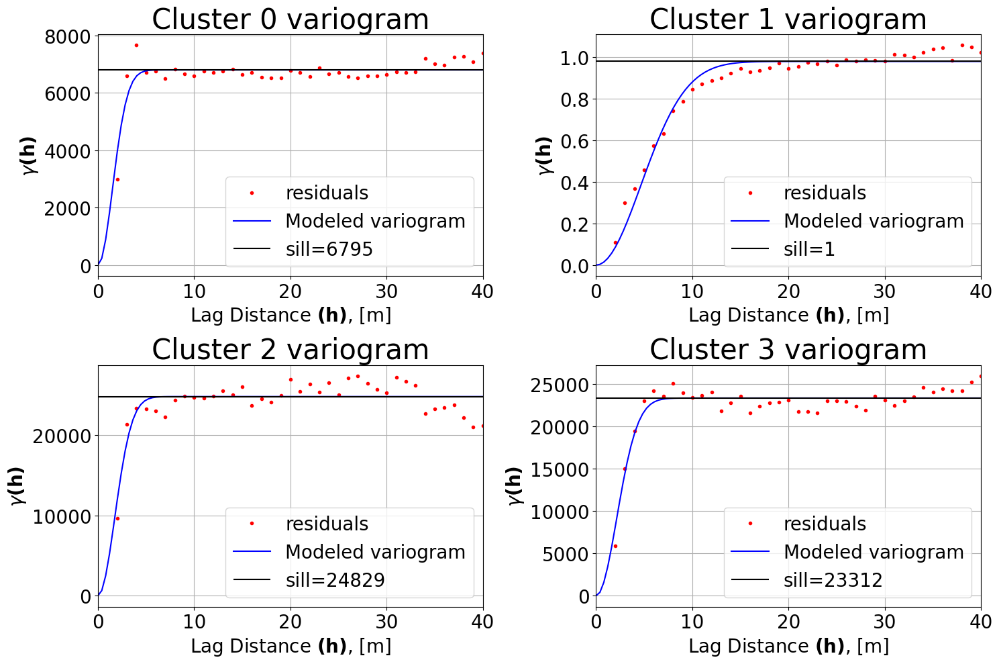

In [67]:
## PLOT CLUSTER-SPECIFIC VARIOGRAMS ##
## ================================ ##

# FIT THEORETICAL VARIOGRAMS

# model used in fit
vtype = 'gaussian'
V0.model = vtype
V1.model = vtype
V2.model = vtype
V3.model = vtype 

# create array of evenly spaced lag values to evaluate
n = 100
lagh = np.linspace(0,40,n)

range0 = V0.parameters[0]; sill0 = V0.parameters[1]; nug0 = V0.parameters[2]
range1 = V1.parameters[0]; sill1 = V1.parameters[1]; nug1 = V1.parameters[2]
range2 = V2.parameters[0]; sill2 = V2.parameters[1]; nug2 = V2.parameters[2]
range3 = V3.parameters[0]; sill3 = V3.parameters[1]; nug3 = V3.parameters[2]

y0 = [models.gaussian(h, range0, sill0, nug0) for h in lagh]
y1 = [models.gaussian(h, range1, sill1, nug1) for h in lagh]
y2 = [models.gaussian(h, range2, sill2, nug2) for h in lagh]
y3 = [models.gaussian(h, range3, sill3, nug3) for h in lagh]

variograms = [V0, V1, V2, V3]
ys = [y0, y1, y2, y3]

# PLOT (2x2 layout)
fig, axs = plt.subplots(2, 2, figsize=(15, 10))  # 2x2 grid
axs = axs.flatten()  # flatten to 1D for iteration

for i, (ax, V, y) in enumerate(zip(axs, variograms, ys)):
    ax.plot(V.bins, V.experimental, '.', color='red', label='residuals')
    ax.plot(lagh, y, '-', color='blue', label='Modeled variogram')
    ax.hlines(y=V.parameters[1], xmin=0, xmax=40,
              color='black', label=f"sill={V.parameters[1]:.0f}")
    ax.set_xlabel(r'Lag Distance $\bf(h)$, [m]')
    ax.set_ylabel(r'$\gamma \bf(h)$')
    ax.set_title(f'Cluster {i} variogram')
    ax.legend(loc='lower right')
    ax.set_xlim([0, 40])
    ax.grid(True)

plt.tight_layout()

# save to PNG (high resolution, transparent background, trimmed)
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/variograms_synthdata.png",
    dpi=300, bbox_inches="tight", transparent=True
)

plt.show()

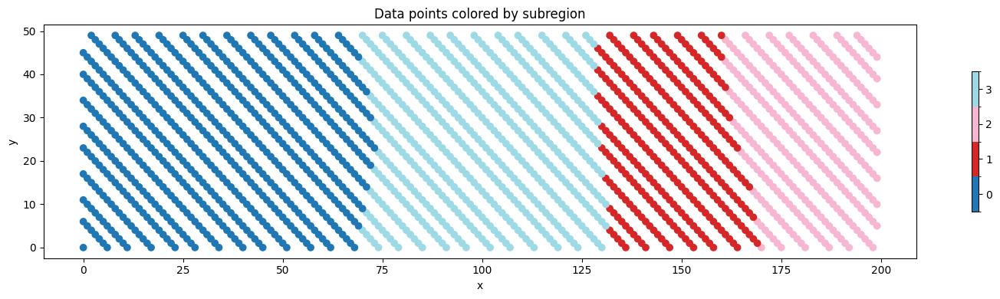

In [17]:
## PLOT CLUSTERED FLILGHTLINES ##
## =========================== ##

# plot flight lines and clustering
plt.figure(figsize=(15,4))
plt.title("fl_xyvc, values")
plt.scatter(fl_xyvc[:,0], fl_xyvc[:,1], c=fl_xyvc[:,3], cmap=cmap, norm=norm)
plt.title(f"Data points colored by subregion")
plt.colorbar(shrink=0.6, ticks=np.arange(n_regions))
plt.xticks(np.arange(0, 201, 25))
plt.yticks(np.arange(0, 51, 10))
plt.xlabel("x")
plt.ylabel("y")
plt.tight_layout()

# save to PNG (high resolution, transparent background, trimmed)
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/clusters_show.png",
    dpi=300, bbox_inches="tight", transparent=True
)

plt.show()

In [18]:
## CREATE VARIOGRAM DATAFRAME ##
## ========================== ##

azimuth = 0
# NOTE: gam = [azimuth, nugget, major_range, minor_range, sill, variogram_type]
gam0 = [azimuth, nug0, range0, range0, sill0, vtype]
gam1 = [azimuth, nug1, range1, range1, sill1, vtype]
gam2 = [azimuth, nug2, range2, range2, sill2, vtype]
gam3 = [azimuth, nug3, range3, range3, sill3, vtype]

df_gamma = pd.DataFrame({'Variogram': [gam0, gam1, gam2, gam3]})
df_gamma


,Variogram
0,"[0, 0, 4.314466089331174, 4.314466089331174, 6..."
1,"[0, 0, 5.798239821874528, 5.798239821874528, 3..."
2,"[0, 0, 4.963245960593904, 4.963245960593904, 2..."
3,"[0, 0, 6.0918538008524425, 6.0918538008524425,..."


## Define variogram per cluster (anisotropy version)

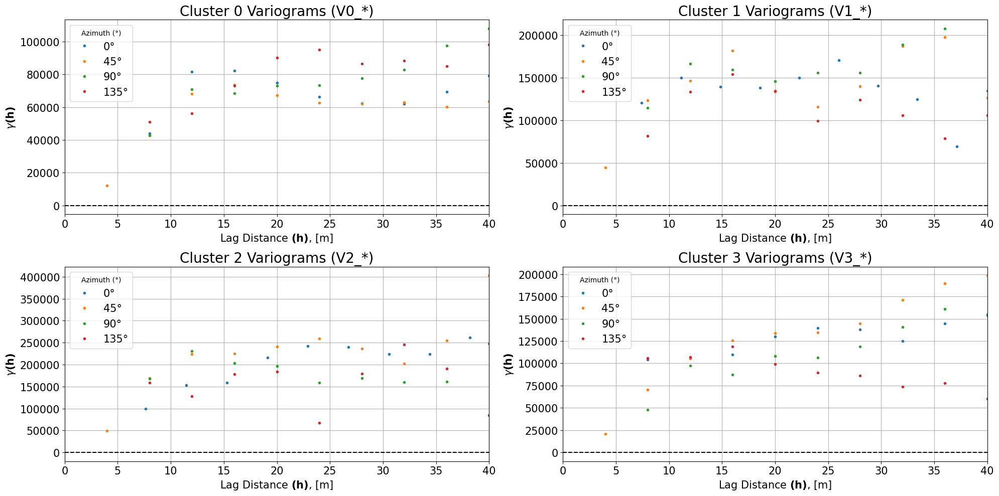

In [200]:
# IF DOING ANISOTROPY
# experimental variogram parameters
maxlag = 40
n_lags = 10 #num of bins

# cluster 0 variograms
df0 = df_fl_xyvctr[df_fl_xyvctr['cluster'] == 0]
coords0 = df0[['x','y']].values
values0 = df0['value']
V0_0 = skg.DirectionalVariogram(coords0, values0, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=0, tolerance=15)
V0_45 = skg.DirectionalVariogram(coords0, values0, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=45, tolerance=15)
V0_90 = skg.DirectionalVariogram(coords0, values0, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=90, tolerance=15)
V0_135 = skg.DirectionalVariogram(coords0, values0, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=135, tolerance=15)

# cluster 1 variogram
df1 = df_fl_xyvctr[df_fl_xyvctr['cluster'] == 1]
coords1 = df1[['x','y']].values
values1 = df1['value']
V1_0 = skg.DirectionalVariogram(coords1, values1, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=0, tolerance=15)
V1_45 = skg.DirectionalVariogram(coords1, values1, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=45, tolerance=15)
V1_90 = skg.DirectionalVariogram(coords1, values1, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=90, tolerance=15)
V1_135 = skg.DirectionalVariogram(coords1, values1, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=135, tolerance=15)

# cluster 2 variogram
df2 = df_fl_xyvctr[df_fl_xyvctr['cluster'] == 2]
coords2 = df2[['x','y']].values
values2 = df2['value']
V2_0 = skg.DirectionalVariogram(coords2, values2, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=0, tolerance=15)
V2_45 = skg.DirectionalVariogram(coords2, values2, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=45, tolerance=15)
V2_90 = skg.DirectionalVariogram(coords2, values2, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=90, tolerance=15)
V2_135 = skg.DirectionalVariogram(coords2, values2, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=135, tolerance=15)

# cluster 3 variogram
df3 = df_fl_xyvctr[df_fl_xyvctr['cluster'] == 3]
coords3 = df3[['x','y']].values
values3 = df3['value']
V3_0 = skg.DirectionalVariogram(coords3, values3, bin_func = "even", n_lags = n_lags, 
                 maxlag = maxlag, normalize=False, azimuth=0, tolerance=15)
V3_45 = skg.DirectionalVariogram(coords3, values3, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=45, tolerance=15)
V3_90 = skg.DirectionalVariogram(coords3, values3, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=90, tolerance=15)
V3_135 = skg.DirectionalVariogram(coords3, values3, bin_func = "even", n_lags = n_lags, 
                   maxlag = maxlag, normalize=False, azimuth=135, tolerance=15)


## PLOT DIRECTIONAL VARIOGRAMS FOR EACH CLUSTER IN 2X2 SUBPLOTS ##
## ============================================================ ##

# Create lists to group variograms by clusters and azimuths
V0_variograms = [V0_0, V0_45, V0_90, V0_135]
V1_variograms = [V1_0, V1_45, V1_90, V1_135]
V2_variograms = [V2_0, V2_45, V2_90, V2_135]
V3_variograms = [V3_0, V3_45, V3_90, V3_135]

# Corresponding labels for each azimuth
labels = ['0°', '45°', '90°', '135°']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 10))  # 2 rows and 2 columns
axs = axs.flatten()  # Flatten the array for easy indexing

# Function to plot variograms for each cluster
def plot_variogram(ax, variograms, labels, title):
    for V, label in zip(variograms, labels):
        ax.plot(V.bins, V.experimental, '.', label=label)  # Plotting experimental variogram data
    ax.set_xlabel(r'Lag Distance $\bf(h)$, [m]')
    ax.set_ylabel(r'$\gamma \bf(h)$')
    ax.set_title(title)
    ax.hlines(y=1.0, xmin=0, xmax=maxlag, color='black', linestyle='--')  # Sill line
    ax.legend(title='Azimuth (°)', loc='upper left')
    ax.set_xlim([0, maxlag])
    ax.grid(True)

# Plot each cluster's variograms in the corresponding subplot
plot_variogram(axs[0], V0_variograms, labels, 'Cluster 0 Variograms (V0_*)')
plot_variogram(axs[1], V1_variograms, labels, 'Cluster 1 Variograms (V1_*)')
plot_variogram(axs[2], V2_variograms, labels, 'Cluster 2 Variograms (V2_*)')
plot_variogram(axs[3], V3_variograms, labels, 'Cluster 3 Variograms (V3_*)')

# Improve layout and display the figure
plt.tight_layout()
plt.show()


In [201]:
def get_cluster_anisotropy_params(cluster_id):
    """
    Extract anisotropy parameters for a given cluster
    Returns major range, minor range, major azimuth, and sill
    """
    
    # Map cluster to variograms
    cluster_variograms = {
        0: V0_variograms,
        1: V1_variograms, 
        2: V2_variograms,
        3: V3_variograms
    }
    
    if cluster_id not in cluster_variograms:
        print(f"Error: Cluster {cluster_id} not found!")
        return None
    
    variograms = cluster_variograms[cluster_id]
    angles = [0, 45, 90, 135]
    
    # Extract ranges and sills from variogram parameters
    ranges = [variograms[i].parameters[0] for i in range(4)]
    sills = [variograms[i].parameters[1] for i in range(4)]
    
    # Find major axis (maximum range)
    max_range_idx = ranges.index(max(ranges))
    major_azimuth = angles[max_range_idx]
    range_maj = ranges[max_range_idx]
    sill = sills[max_range_idx]
    
    # Find minor axis (90 degrees from major)
    # Handle angle wrapping
    minor_azimuth = (major_azimuth + 90) % 180
    if minor_azimuth == 180:
        minor_azimuth = 0
    
    # Find the index for minor azimuth
    try:
        minor_range_idx = angles.index(minor_azimuth)
        range_min = ranges[minor_range_idx]
    except ValueError:
        # If exact 90° rotation not in our angles, find closest
        minor_diffs = [abs(angle - minor_azimuth) for angle in angles]
        minor_range_idx = minor_diffs.index(min(minor_diffs))
        range_min = ranges[minor_range_idx]
        minor_azimuth = angles[minor_range_idx]
    
    # Print results
    print(f"=== CLUSTER {cluster_id} ANISOTROPY PARAMETERS ===")
    print(f"Major azimuth: {major_azimuth}°")
    print(f"Range major: {range_maj:.2f}")
    print(f"Range minor: {range_min:.2f}")
    print(f"Sill: {sill:.3f}")
    print(f"Anisotropy ratio: {range_min/range_maj:.2f}")
    
    # Create variable names as you specified
    globals()[f'rangemaj{cluster_id}'] = range_maj
    globals()[f'rangemin{cluster_id}'] = range_min
    globals()[f'sill{cluster_id}'] = sill
    globals()[f'azimuth{cluster_id}'] = major_azimuth
    
    print(f"\nCreated variables:")
    print(f"rangemaj{cluster_id} = {range_maj:.2f}")
    print(f"rangemin{cluster_id} = {range_min:.2f}")
    print(f"sill{cluster_id} = {sill:.3f}")
    print(f"azimuth{cluster_id} = {major_azimuth}")
    
    return {
        'rangemaj': range_maj,
        'rangemin': range_min,
        'sill': sill,
        'azimuth': major_azimuth,
        'ranges_all': ranges,
        'sills_all': sills,
        'angles': angles
    }

# Usage:
params0 = get_cluster_anisotropy_params(0)
print("\n" + "="*50)
params1 = get_cluster_anisotropy_params(1)
print("\n" + "="*50)
params2 = get_cluster_anisotropy_params(2)
print("\n" + "="*50)
params3 = get_cluster_anisotropy_params(3)

# Now you'll have variables like:
# rangemaj0, rangemin0, sill0, azimuth0
# rangemaj1, rangemin1, sill1, azimuth1
# etc.

=== CLUSTER 0 ANISOTROPY PARAMETERS ===
Major azimuth: 90°
Range major: 24.46
Range minor: 14.56
Sill: 87002.912
Anisotropy ratio: 0.60

Created variables:
rangemaj0 = 24.46
rangemin0 = 14.56
sill0 = 87002.912
azimuth0 = 90

=== CLUSTER 1 ANISOTROPY PARAMETERS ===
Major azimuth: 45°
Range major: 14.94
Range minor: 13.49
Sill: 155060.644
Anisotropy ratio: 0.90

Created variables:
rangemaj1 = 14.94
rangemin1 = 13.49
sill1 = 155060.644
azimuth1 = 45

=== CLUSTER 2 ANISOTROPY PARAMETERS ===
Major azimuth: 0°
Range major: 27.11
Range minor: 11.40
Sill: 238744.134
Anisotropy ratio: 0.42

Created variables:
rangemaj2 = 27.11
rangemin2 = 11.40
sill2 = 238744.134
azimuth2 = 0

=== CLUSTER 3 ANISOTROPY PARAMETERS ===
Major azimuth: 90°
Range major: 40.00
Range minor: 18.72
Sill: 152782.805
Anisotropy ratio: 0.47

Created variables:
rangemaj3 = 40.00
rangemin3 = 18.72
sill3 = 152782.805
azimuth3 = 90


In [195]:
## CREATE VARIOGRAM DATAFRAME WITH ANISOTROPY ##
## ========================================== ##

# nugget effect
nug = 0 

# variogram model
vtype = 'Gaussian'

# from get_cluster_anisotropy_params() function
# cluster 0
rangemaj0, rangemin0, sill0, azimuth0 = params0['rangemaj'], params0['rangemin'], params0['sill'], params0['azimuth']
# cluster 1
rangemaj1, rangemin1, sill1, azimuth1 = params1['rangemaj'], params1['rangemin'], params1['sill'], params1['azimuth']
# cluster 2
rangemaj2, rangemin2, sill2, azimuth2 = params2['rangemaj'], params2['rangemin'], params2['sill'], params2['azimuth']
# cluster 3
rangemaj3, rangemin3, sill3, azimuth3 = params3['rangemaj'], params3['rangemin'], params3['sill'], params3['azimuth']

# NOTE: can also manually set these values if desired, e.g., rangemaj = V0_0.parameters[0], etc.

# define variograms for each cluster
# Azimuth, nugget, major range, minor range, sill
gam0 = [azimuth0, nug, rangemaj0, rangemin0, sill0, vtype]
gam1 = [azimuth1, nug, rangemaj1, rangemin1, sill1, vtype]
gam2 = [azimuth2, nug, rangemaj2, rangemin2, sill2, vtype]
gam3 = [azimuth3, nug, rangemaj3, rangemin3, sill3, vtype]

# store variogram parameters
df_gamma = pd.DataFrame({'Variogram': [gam0, gam1, gam2, gam3]})
df_gamma

,Variogram
0,"[90, 0, 24.457799087965526, 14.560689568168366..."
1,"[45, 0, 14.940949171175633, 13.492590583341984..."
2,"[0, 0, 27.112361501199736, 11.402321631384359,..."
3,"[90, 0, 39.99999999909851, 18.72288371295283, ..."


## MultiGrid simulation (single realization)

In [185]:
## RUN MGSIM ##
## ========= ##

mg_resols = [20,10,5,4,3,2,1] #[pixels]
df_grid = df_xyvtcs
df_mgsim = mgsim(mg_resols, df_grid, df_gamma, xx='x', yy='y', zz='residual', kk='cluster', num_points=10, radius=40)

MultiGrid iteration 1: Processing resolution 20


100%|██████████| 10000/10000 [00:28<00:00, 355.60it/s]


MultiGrid iteration 2: Processing resolution 10


100%|██████████| 10000/10000 [00:27<00:00, 357.75it/s]


MultiGrid iteration 3: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 368.56it/s]


MultiGrid iteration 4: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 374.70it/s]


MultiGrid iteration 5: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 394.74it/s]


MultiGrid iteration 6: Processing resolution 2


100%|██████████| 10000/10000 [00:23<00:00, 420.10it/s]


MultiGrid iteration 7: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 421.66it/s]


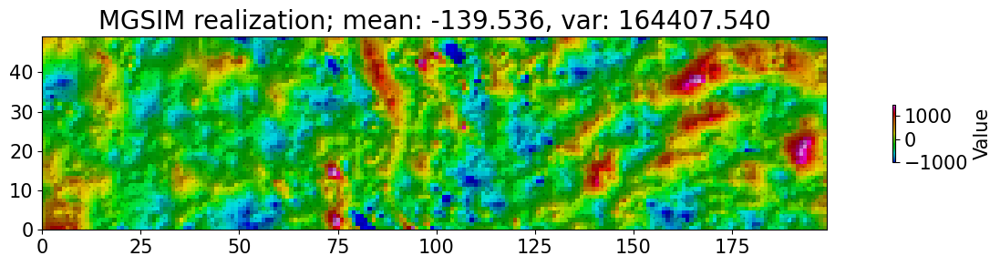

In [187]:
## ======================== ##
## PLOT REALIZATION EXAMPLE ##
## ======================== ##

plt.rcParams.update({
    "axes.titlesize": 20,
    "axes.labelsize": 15,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "legend.fontsize": 15,
})

x_coords = df_mgsim['x'].values
y_coords = df_mgsim['y'].values
values = df_mgsim['newtrend'].values

rows, cols = 50, 200

x_mat = x_coords.reshape((rows, cols))
y_mat = y_coords.reshape((rows, cols))
mat = values.reshape((rows, cols))


# --- grid + data you already have ---
# x_coords, y_coords, values (1D); mat is values.reshape((rows, cols))

# --- extent from coords (so imshow aligns to your x/y units) ---
xmin, xmax = float(x_coords.min()), float(x_coords.max())
ymin, ymax = float(y_coords.min()), float(y_coords.max())
extent = [xmin, xmax, ymin, ymax]

# --- light shading params + colormap range ---
vmin, vmax = -1000, 1500
ls = LightSource(azdeg=45, altdeg=45)  # tweak if you want
rgb_trend = ls.shade(mat, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)

# --- mappable for colorbar (must match vmin/vmax + cmap used in shade) ---
mappable = ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
mappable.set_array([])

# --- plot ---
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_trend, origin='lower', extent=extent)
ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
ax.set_title(f"MGSIM realization; mean: {np.nanmean(values):.3f}, var: {np.nanvar(values):.3f}")

# (optional) overlay sample locations
x_coords = df_fl_xyvctr['x'].values
y_coords = df_fl_xyvctr['y'].values
ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.3, linewidths=0, rasterized=True)

fig.colorbar(mappable, ax=ax, shrink=0.3, label="Value")
plt.tight_layout()
plt.show()

## MG simulation with intermittent plots

MultiGrid iteration 1: Processing resolution 20


100%|██████████| 10000/10000 [00:29<00:00, 344.64it/s]


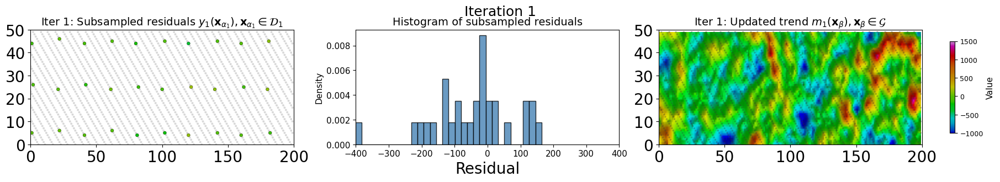

MultiGrid iteration 2: Processing resolution 10


100%|██████████| 10000/10000 [00:28<00:00, 354.56it/s]


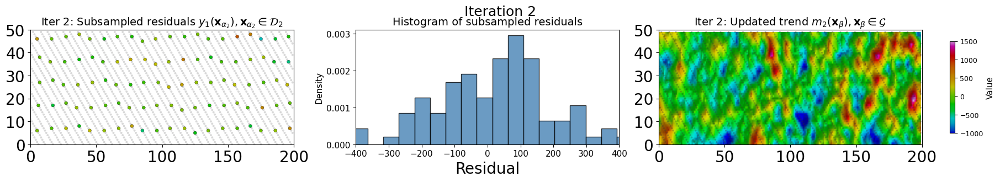

MultiGrid iteration 3: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 365.24it/s]


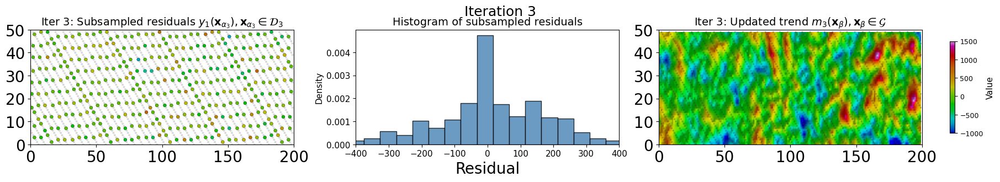

MultiGrid iteration 4: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 373.38it/s]


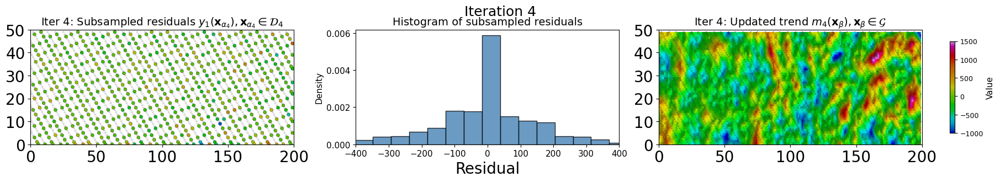

MultiGrid iteration 5: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 395.61it/s]


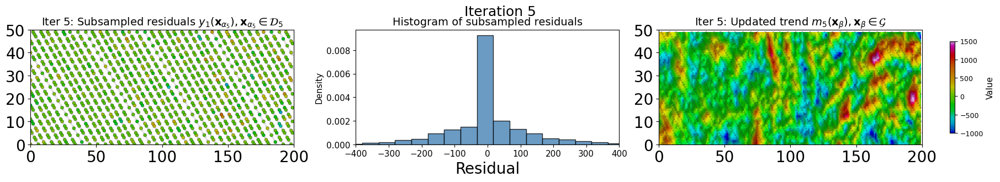

MultiGrid iteration 6: Processing resolution 2


100%|██████████| 10000/10000 [00:23<00:00, 420.69it/s]


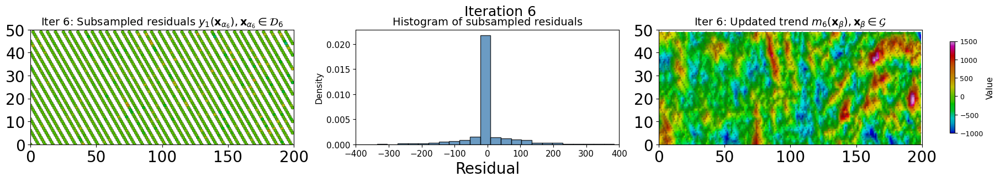

MultiGrid iteration 7: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 419.90it/s]


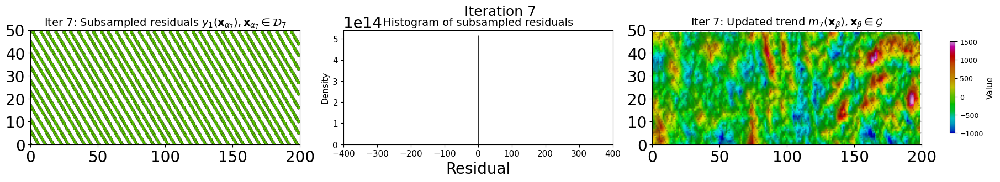

In [157]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LightSource
from matplotlib.cm import ScalarMappable

def _infer_grid_shape(df, xx='x', yy='y'):
    xs = np.unique(df[xx].values)
    ys = np.unique(df[yy].values)
    return len(ys), len(xs), xs, ys

def _to_grid(df, zcol, rows, cols, xx='x', yy='y'):
    order = np.lexsort((df[xx].values, df[yy].values))  # sort by y, then x
    return df[zcol].values[order].reshape((rows, cols))

def mgsim_wplots(mg_resols,
                 df_xyvtcs,
                 df_gamma,
                 xx='x', yy='y', zz='residual', kk='cluster',
                 num_points=10, radius=40,
                 rows=None, cols=None,
                 cmap=None, vmin=-1000, vmax=1500,
                 ls_az=45, ls_alt=45):
    """
    Per-iteration diagnostics:
      (1) subsampled residuals at flightline locations (scatter)
      (2) histogram of subsampled residual values
      (3) updated trend (LightSource hillshade + flightline overlay)
    """
    if cmap is None:
        cmap = globals().get('geosoft_cmap', plt.get_cmap('viridis'))

    df = df_xyvtcs.copy()
    pred_xy_grid = df[[xx, yy]].values

    # initial residual & newtrend
    df['residual'] = df['value'] - df['trend']
    df['newtrend'] = df['trend'].copy()

    # grid geometry
    if (rows is None) or (cols is None):
        rows, cols, xvals, yvals = _infer_grid_shape(df, xx=xx, yy=yy)
    else:
        xvals = np.unique(df[xx].values)
        yvals = np.unique(df[yy].values)

    xmin, xmax = float(xvals.min()), float(xvals.max())
    ymin, ymax = float(yvals.min()), float(yvals.max())
    extent = [xmin, xmax, ymin, ymax]

    ls = LightSource(azdeg=ls_az, altdeg=ls_alt)

    for i, mg_resol in enumerate(mg_resols, start=1):
        print(f"MultiGrid iteration {i}: Processing resolution {mg_resol}")

        # FLIGHTLINE (observation) points
        df_obspts = df[df['set'] == 1].copy()

        # subsample *from flightlines only*
        df_mgsmpl = subsample_dataframe(
            df_obspts, column_for_sampling='residual', spacing=mg_resol
        )

        # SGS
        mgsgs = gs.Interpolation.cluster_sgs(
            pred_xy_grid, df_mgsmpl, xx, yy, zz, kk, num_points, df_gamma, radius
        )

        # update trend & residuals
        df['newtrend'] = df['newtrend'] + mgsgs
        df['residual'] = df['value'] - df['newtrend']

        # build trend image
        trend_grid = _to_grid(df, 'newtrend', rows, cols, xx=xx, yy=yy)
        rgb_trend = ls.shade(trend_grid, cmap=cmap, blend_mode='soft',
                             vmin=vmin, vmax=vmax)
        mappable_trend = ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=cmap)
        mappable_trend.set_array([])

        # ----------------- PLOTS -----------------
        fig, axes = plt.subplots(1, 3, figsize=(18, 3), constrained_layout=True)

        # (1) Residuals at flightlines only
        axes[0].scatter(
            df_obspts[xx].values, df_obspts[yy].values,
            s=8, c='0.75', edgecolor='none', alpha=0.6, rasterized=True
        )
        sc = axes[0].scatter(
            df_mgsmpl[xx].values, df_mgsmpl[yy].values,
            c=df_mgsmpl[zz].values, s=18, cmap=cmap,
            vmin=vmin, vmax=vmax, edgecolor='k', linewidths=0.25
        )
        axes[0].set_title(fr"Iter {i}: Subsampled residuals $y_1(\mathbf{{x}}_{{\alpha_{i}}}), \mathbf{{x}}_{{\alpha_{i}}}\in\mathcal{{D}}_{i}$", fontsize=14),
        axes[0].set_xlim(xmin, xmax); axes[0].set_ylim(ymin, ymax)
        axes[0].set_xlim(0, 200)
        axes[0].set_ylim(0, 50)
        # force ticks so 200 and 50 show up
        axes[0].set_xticks(np.arange(0, 201, 50))
        axes[0].set_yticks(np.arange(0, 51, 10))
        axes[0].set_aspect('equal' if np.isclose((xmax-xmin)/(ymax-ymin), 1.0) else 'auto')
        # fig.colorbar(sc, ax=axes[0], shrink=0.8, label="Residual")

        # (2) Histogram of subsampled residual values
        resvals = df_mgsmpl[zz].values
        axes[1].hist(
            resvals, bins=30, color='steelblue',
            edgecolor='k', alpha=0.8, density=True
        )
        axes[1].set_title("Histogram of subsampled residuals", fontsize=14)
        axes[1].set_xlabel("Residual")
        axes[1].set_ylabel("Density", fontsize=11)
        axes[1].set_xlim(-400, 400)
        # change tick sizes
        axes[1].tick_params(axis='both', which='major', labelsize=11)
        axes[1].tick_params(axis='both', which='minor', labelsize=8)

        # (3) Updated trend (hillshaded) + overlay flightlines
        axes[2].imshow(rgb_trend, origin='lower', extent=extent, aspect='auto')
        # overlay flightline locations (light gray dots)
        axes[2].scatter(
            df_obspts[xx].values, df_obspts[yy].values,
            s=6, c='0.2', alpha=0.3, edgecolor='none', rasterized=True
        )
        axes[2].set_xlim(xmin, xmax); axes[2].set_ylim(ymin, ymax)
        axes[2].set_xlim(0, 200)
        axes[2].set_ylim(0, 50)
        # force ticks so 200 and 50 show up
        axes[2].set_xticks(np.arange(0, 201, 50))
        axes[2].set_yticks(np.arange(0, 51, 10))
        axes[2].set_title(f"Iter {i}: Updated trend $m_{{{i}}}(\mathbf{{x}}_\\beta), \mathbf{{x}}_\\beta\in\mathcal{{G}}$", fontsize=14)
        # fig.colorbar(mappable_trend, ax=axes[2], shrink=0.8, label="value")
        cbar = fig.colorbar(mappable_trend, ax=axes[2], shrink=0.8)
        cbar.set_label("Value", fontsize=11)
        cbar.ax.tick_params(labelsize=9)

        # headline stats
        vals = df['newtrend'].values
        fig.suptitle(
            # f"Iteration {i}: Trend mean={np.nanmean(vals):.3f}, var={np.nanvar(vals):.3f}",
            f"Iteration {i}",
            y=1.05, fontsize=18
        )

        # save to PNG (high resolution, transparent background, trimmed)
        plt.savefig(
            f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/mgsim_synth_iter_{i}.png",
            dpi=300, bbox_inches="tight", transparent=True
        )

        plt.show()

    return df

## USE ##
mg_resols = [20,10,5,4,3,2,1] #[pixels]
df_grid = df_xyvtcs
df_mgsim = mgsim_wplots(mg_resols, df_grid, df_gamma, xx='x', yy='y', zz='residual', kk='cluster', num_points=10, radius=40)


## Traditional methods comparison

In [129]:
df_fl_xyvctr

,x,y,value,cluster,trend,residual,nval
0,0.0,0.0,474.224075,0.0,474.194063,0.030012,1.526612
1,6.0,0.0,749.593665,0.0,497.192659,252.401006,1.907073
2,11.0,0.0,131.113667,0.0,128.307570,2.806097,0.787838
3,17.0,0.0,-270.998116,0.0,-293.997459,22.999343,-0.206810
4,23.0,0.0,-432.319171,0.0,-341.852114,-90.467057,-0.790358
...,...,...,...,...,...,...,...
1762,172.0,49.0,-85.778192,2.0,338.718130,-424.496322,0.350492
1763,177.0,49.0,-56.395633,2.0,213.311455,-269.707088,0.416444
1764,183.0,49.0,-152.121354,2.0,146.253865,-298.375219,0.147443
1765,189.0,49.0,-178.280258,2.0,49.539052,-227.819310,0.087298


In [130]:
## KRIGING ##
## ======= ##

# normal score transformation
data = df_fl_xyvctr['value'].values.reshape(-1,1)
nst_trans = QuantileTransformer(n_quantiles=500, output_distribution="normal").fit(data)
df_fl_xyvctr['nval'] = nst_trans.transform(data) 

# compute experimental (isotropic) variogram
coords = df_fl_xyvctr[['x','y']].values
values = df_fl_xyvctr['nval']

maxlag = 40             # maximum range distance
n_lags = 40                # num of bins

V1 = skg.Variogram(coords, values, bin_func='even', n_lags=n_lags, 
                   maxlag=maxlag, normalize=False)

# use exponential variogram model
V1.model = 'exponential'
V1.parameters

# define coordinate grid
xmin = np.min(df_fl_xyvctr['x']); xmax = np.max(df_fl_xyvctr['x'])     # min and max x values
ymin = np.min(df_fl_xyvctr['y']); ymax = np.max(df_fl_xyvctr['y'])     # min and max y values
extent = [xmin, xmax, ymin, ymax]

res = 1
Pred_grid_xy = gs.Gridding.prediction_grid(xmin, xmax, ymin, ymax, res)

# set variogram parameters
azimuth = 0
nugget = V1.parameters[2]

# the major and minor ranges are the same in this example because it is isotropic
major_range = V1.parameters[0]
minor_range = V1.parameters[0]
sill = V1.parameters[1]
vtype = 'Exponential'

# save variogram parameters as a list
vario = [azimuth, nugget, major_range, minor_range, sill, vtype]


k = 10         # number of neighboring data points used to estimate a given point
rad = 40       #  search radius

# est_SK is the estimate and var_SK is the variance
est_SK, var_SK = gs.Interpolation.skrige(Pred_grid_xy, df_fl_xyvctr, 'x', 'y', 'nval', k, vario, rad)

# reverse normal score transformation
var_SK[var_SK < 0] = 0      # make sure variances are non-negative
std_SK = np.sqrt(var_SK)    # convert to standard deviation before back transforming

# reshape
est = est_SK.reshape(-1,1)
std = std_SK.reshape(-1,1)

# back transformation
spred_trans = nst_trans.inverse_transform(est)
sstd_trans = nst_trans.inverse_transform(std)
sstd_trans = sstd_trans - np.min(sstd_trans)


100%|██████████| 10000/10000 [00:17<00:00, 559.29it/s]


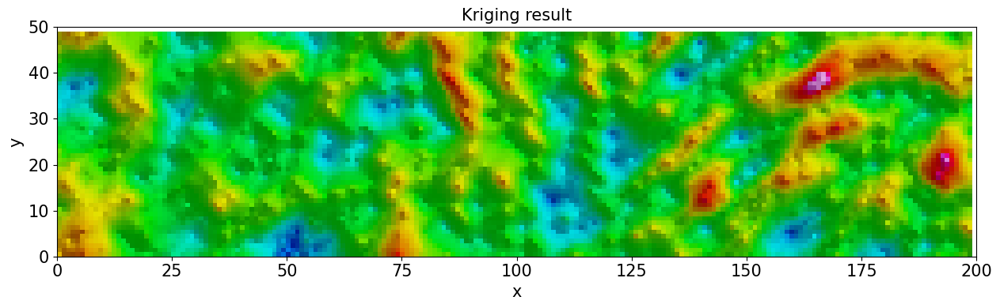

In [340]:
## PLOT OF KRIGING RESULT ##
## ====================== ##

plt.rcParams.update({
    "axes.titlesize": 15,
    "axes.labelsize": 15,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "legend.fontsize": 15,
})

x_coords = df_fl_xyvctr['x'].values
y_coords = df_fl_xyvctr['y'].values
values = spred_trans

rows, cols = 50, 200

mat = values.reshape((rows, cols))

# --- grid + data you already have ---
# x_coords, y_coords, values (1D); mat is values.reshape((rows, cols))

# --- extent from coords (so imshow aligns to your x/y units) ---
xmin, xmax = float(x_coords.min()), float(x_coords.max())
ymin, ymax = float(y_coords.min()), float(y_coords.max())
extent = [xmin, xmax, ymin, ymax]

# --- light shading params + colormap range ---
vmin, vmax = -1000, 1500
ls = LightSource(azdeg=45, altdeg=45)  # tweak if you want
rgb_trend = ls.shade(mat, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)

# --- mappable for colorbar (must match vmin/vmax + cmap used in shade) ---
mappable = ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
mappable.set_array([])

# --- plot ---
fig, ax = plt.subplots(figsize=(18, 4))
ax.imshow(rgb_trend, origin='upper', extent=extent)
ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
# ax.set_title(f"Kriging result; mean: {np.nanmean(values):.3f}, var: {np.nanvar(values):.3f}")
ax.set_title(f"Kriging result")


# (optional) overlay sample locations
# ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

# axes labels
ax.set_xlabel("x")
ax.set_ylabel("y")

# fig.colorbar(mappable, ax=ax, shrink=0.7, label="Value")
plt.tight_layout()

# save clean image
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_kriging_result.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()


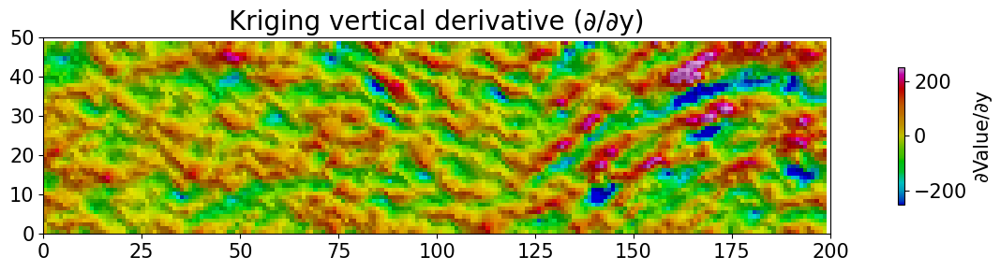

In [149]:
## VERTICAL DERIVATIVE OF KRIGING RESULT (SAVED AS SEPARATE FIGURE) ##
## ================================================================ ##

# Assumes: rows, cols, extent, geosoft_cmap, ls, and mat from your block above
# mat = values.reshape((rows, cols))

# --- compute vertical derivative (∂/∂y) ---
dy = (extent[3] - extent[2]) / (rows - 1)
vert_deriv = np.gradient(mat, dy, axis=0)

# --- robust color limits to avoid extreme outliers ---
vmin_d, vmax_d = -250, 250

# --- shaded relief in same style as main plot ---
rgb_dy = ls.shade(vert_deriv, cmap=geosoft_cmap, blend_mode='soft',
                  vmin=vmin_d, vmax=vmax_d)

# --- plot ---
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_dy, origin='upper', extent=extent)
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))
ax.set_title("Kriging vertical derivative (∂/∂y)")

# --- colorbar ---
mappable_dy = ScalarMappable(norm=Normalize(vmin=vmin_d, vmax=vmax_d),
                             cmap=geosoft_cmap)
mappable_dy.set_array([])
fig.colorbar(mappable_dy, ax=ax, shrink=0.7, label="∂Value/∂y")

plt.tight_layout()

# --- save clean image ---
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_kriging_result_dy.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()


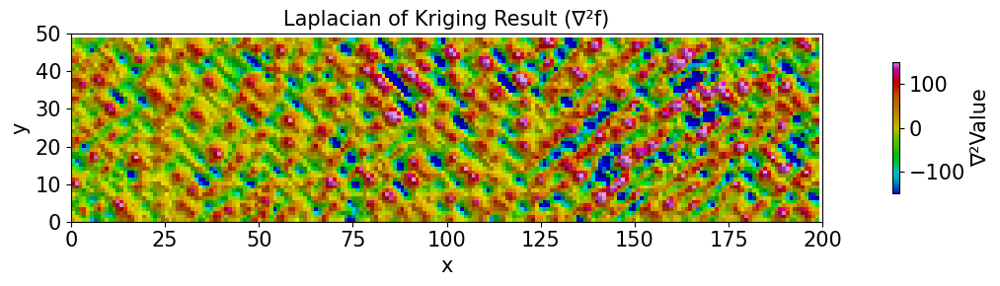

In [341]:
## LAPLACIAN OF KRIGING RESULT (SAVED AS SEPARATE FIGURE) ##
## ======================================================= ##

# Assumes: rows, cols, extent, geosoft_cmap, ls, and mat from your block above
# mat = values.reshape((rows, cols))

# --- grid spacing ---
dx = (extent[1] - extent[0]) / (cols - 1)
dy = (extent[3] - extent[2]) / (rows - 1)

# --- first derivatives ---
df_dy, df_dx = np.gradient(mat, dy, dx)

# --- second derivatives ---
d2f_dyy, _ = np.gradient(df_dy, dy, dx)
_, d2f_dxx = np.gradient(df_dx, dy, dx)

# --- Laplacian: ∇²f = f_xx + f_yy ---
laplacian = d2f_dxx + d2f_dyy

# --- color limits (match your style) ---
vmin_l, vmax_l = -150, 150

# --- shaded relief in same style as main plot ---
rgb_lap = ls.shade(laplacian, cmap=geosoft_cmap, blend_mode='soft',
                   vmin=vmin_l, vmax=vmax_l)

# --- plot ---
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_lap, origin='upper', extent=extent)
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))
ax.set_title("Laplacian of Kriging Result (∇²f)")
ax.set_xlabel("x")
ax.set_ylabel("y")

# (optional) overlay sample locations
# ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

# --- colorbar ---
mappable_lap = ScalarMappable(norm=Normalize(vmin=vmin_l, vmax=vmax_l),
                              cmap=geosoft_cmap)
mappable_lap.set_array([])
fig.colorbar(mappable_lap, ax=ax, shrink=0.7, label="∇²Value")

plt.tight_layout()

# --- save clean image ---
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_kriging_result_laplacian.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()


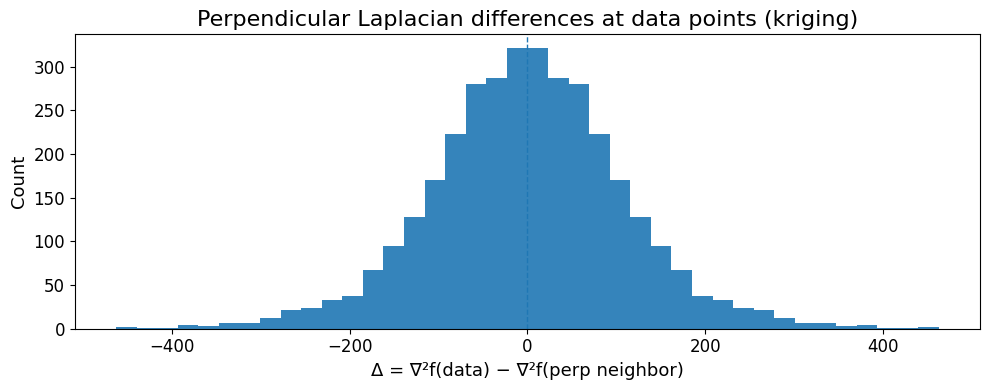

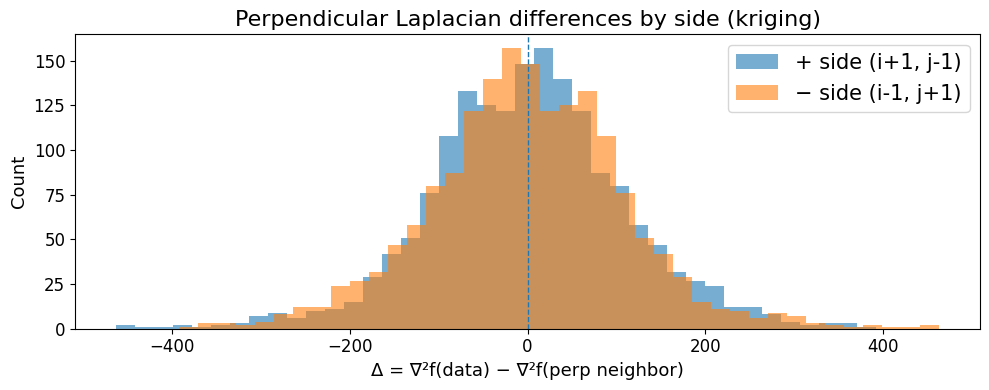

In [267]:
## PERPENDICULAR LAPLACIAN DIFFERENCES AT DATA LOCATIONS + HISTOGRAM ##
## ================================================================= ##

# Assumes:
# - laplacian: 2D array computed above (same shape as mat: (rows, cols))
# - extent = [xmin, xmax, ymin, ymax]
# - rows, cols
# - x_coords, y_coords are your data locations
# - For your Kriging plots you used origin='upper'; we map accordingly.

xmin, xmax, ymin, ymax = extent
dx_pix = (xmax - xmin) / (cols - 1)
dy_pix = (ymax - ymin) / (rows - 1)

def xy_to_ij(x, y):
    """Map world coords to array indices for an imshow(origin='upper') grid."""
    j = int(np.rint((x - xmin) / dx_pix))
    i = int(np.rint((ymax - y) / dy_pix))  # flip y -> row index (top = 0)
    # clip to bounds
    if j < 0 or j >= cols or i < 0 or i >= rows:
        return None
    return i, j

# Perpendicular to 45° lines → use diagonal neighbors (±1, ∓1)
# perp_offsets = [(+1, -1), (-1, +1)]
perp_offsets = [(+1, +1), (-1, -1)]

diffs_all = []
diff_plus = []   # using (+1, -1)
diff_minus = []  # using (-1, +1)

for x, y in zip(x_coords, y_coords):
    idx = xy_to_ij(float(x), float(y))
    if idx is None:
        continue
    i, j = idx
    c = laplacian[i, j]
    if not np.isfinite(c):
        continue

    # (+1, -1)
    ii, jj = i + perp_offsets[0][0], j + perp_offsets[0][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_plus.append(d)

    # (-1, +1)
    ii, jj = i + perp_offsets[1][0], j + perp_offsets[1][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_minus.append(d)

diffs_all_kriging = np.asarray(diffs_all, dtype=float)
diff_plus  = np.asarray(diff_plus, dtype=float)
diff_minus = np.asarray(diff_minus, dtype=float)

# --- Histogram (combined) ---
plt.rcParams.update({
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diffs_all_kriging, bins=40, alpha=0.9)
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences at data points (kriging)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/kriging_laplacian_perp_diffs_hist.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()

# --- (Optional) Separate histograms for each side ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diff_plus,  bins=40, alpha=0.6, label="+ side (i+1, j-1)")
ax.hist(diff_minus, bins=40, alpha=0.6, label="− side (i-1, j+1)")
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences by side (kriging)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
ax.legend()
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/kriging_laplacian_perp_diffs_hist_sides.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()


In [311]:
## SGSIM ##
## ===== ##

# make random number generator for repeatability
rng = np.random.default_rng()

# set variogram parameters
azimuth = 0
nugget = V1.parameters[2]

# the major and minor ranges are the same in this example because it is isotropic
major_range = V1.parameters[0]
minor_range = V1.parameters[0]
sill = V1.parameters[1]
vtype = 'Exponential'

# save variogram parameters as a list
vario = [azimuth, nugget, major_range, minor_range, sill, vtype]

k = 10         # number of neighboring data points used to estimate a given point 
rad = 40       # search radius

sim = gs.Interpolation.okrige_sgs(Pred_grid_xy, df_fl_xyvctr, 'x', 'y', 'nval', k, vario, rad, seed=rng) 

# reverse normal score transformation
sim1 = sim.reshape(-1,1)
sim_trans = nst_trans.inverse_transform(sim1)


100%|██████████| 10000/10000 [00:21<00:00, 472.95it/s]


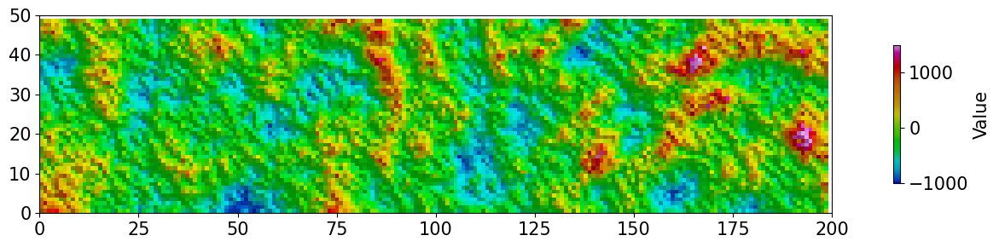

In [318]:
## PLOT OF SGSIM RESULT ##
## ==================== ##

plt.rcParams.update({
    "axes.titlesize": 20,
    "axes.labelsize": 15,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "legend.fontsize": 15,
})

x_coords = df_fl_xyvctr['x'].values
y_coords = df_fl_xyvctr['y'].values
values = sim_trans

rows, cols = 50, 200

mat = values.reshape((rows, cols))

# --- grid + data you already have ---
# x_coords, y_coords, values (1D); mat is values.reshape((rows, cols))

# --- extent from coords (so imshow aligns to your x/y units) ---
xmin, xmax = float(x_coords.min()), float(x_coords.max())
ymin, ymax = float(y_coords.min()), float(y_coords.max())
extent = [xmin, xmax, ymin, ymax]

# --- light shading params + colormap range ---
vmin, vmax = -1000, 1500
ls = LightSource(azdeg=45, altdeg=45)  # tweak if you want
rgb_trend = ls.shade(mat, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)

# --- mappable for colorbar (must match vmin/vmax + cmap used in shade) ---
mappable = ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
mappable.set_array([])

# --- plot ---
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_trend, origin='upper', extent=extent)
ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
# ax.set_title(f"SGSIM result; mean: {np.nanmean(values):.3f}, var: {np.nanvar(values):.3f}")
# ax.set_title(f"SGSIM realization example")

# (optional) overlay sample locations
# ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

fig.colorbar(mappable, ax=ax, shrink=0.7, label="Value")
plt.tight_layout()

# save clean image
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_SGSIM_result.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()


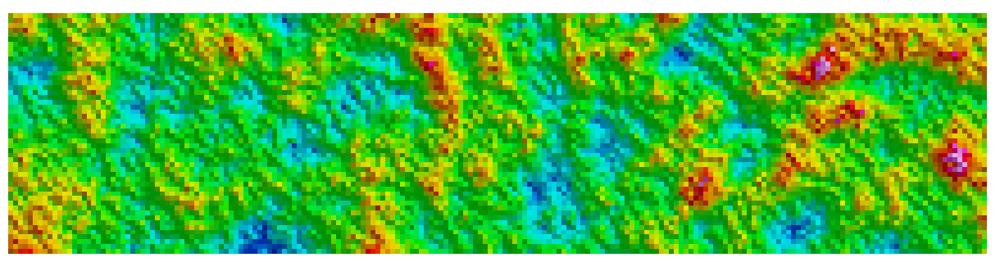

In [312]:
## PLOT OF SGSIM RESULT (NAKED) ##
## ============================== ##

plt.rcParams.update({
    "axes.titlesize": 20,
    "axes.labelsize": 15,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "legend.fontsize": 15,
})

x_coords = df_fl_xyvctr['x'].values
y_coords = df_fl_xyvctr['y'].values
values = sim_trans

rows, cols = 50, 200
mat = values.reshape((rows, cols))

# extent from coords (so imshow aligns correctly)
xmin, xmax = float(x_coords.min()), float(x_coords.max())
ymin, ymax = float(y_coords.min()), float(y_coords.max())
extent = [xmin, xmax, ymin, ymax]

# shading parameters
vmin, vmax = -1000, 1500
ls = LightSource(azdeg=45, altdeg=45)
rgb_trend = ls.shade(mat, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)

# plot without axes, ticks, labels, or colorbar
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_trend, origin='upper', extent=extent)
# ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

# clean / naked look
ax.axis('off')
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_SGSIM_result_naked.png",
    dpi=300, bbox_inches='tight', pad_inches=0, transparent=True
)
plt.show()


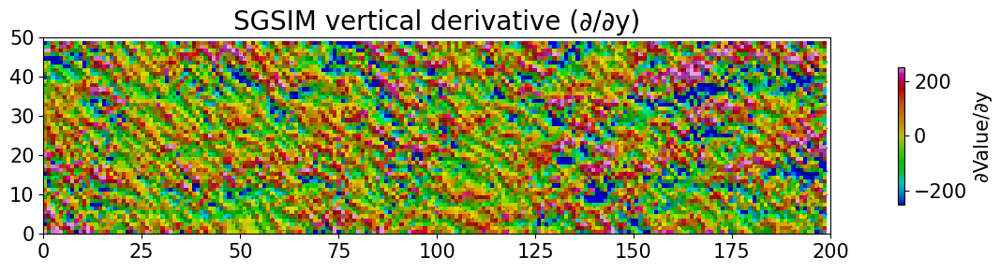

In [269]:
## VERTICAL DERIVATIVE OF SGSIM RESULT (SAVED AS SEPARATE FIGURE) ##
## =============================================================== ##

# Assumes: rows, cols, extent, geosoft_cmap, ls, and mat from your cell above
# mat is values.reshape((rows, cols))

# physical spacing in y (same units as your extent)
dy = (extent[3] - extent[2]) / (rows - 1)

# compute ∂/∂y along the first axis
vert_deriv = np.gradient(mat, dy, axis=0)

# robust color limits to avoid outliers dominating
vmin_d, vmax_d = -250, 250

# shaded relief style to match original
rgb_dy = ls.shade(vert_deriv, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin_d, vmax=vmax_d)

# plot
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_dy, origin='upper', extent=extent)
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))
ax.set_title("SGSIM vertical derivative (∂/∂y)")

# (optional) overlay sample locations
ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

# matching colorbar
mappable_dy = ScalarMappable(norm=Normalize(vmin=vmin_d, vmax=vmax_d), cmap=geosoft_cmap)
mappable_dy.set_array([])
fig.colorbar(mappable_dy, ax=ax, shrink=0.7, label="∂Value/∂y")

plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_SGSIM_result_dy.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)
plt.show()


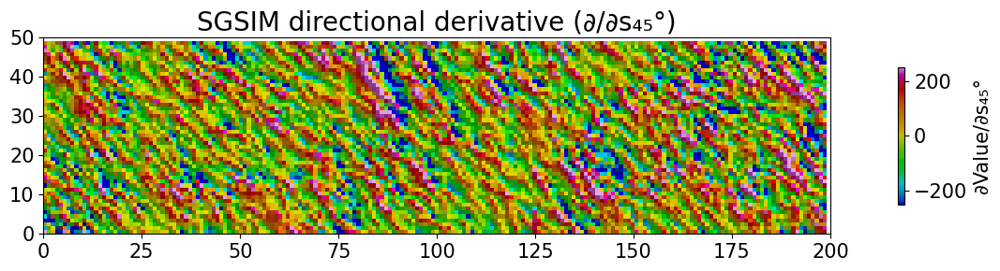

In [144]:
## DIRECTIONAL (45°) DERIVATIVE OF SGSIM RESULT ##
## ============================================ ##

# grid spacing (same as before)
dx = (extent[1] - extent[0]) / (cols - 1)
dy = (extent[3] - extent[2]) / (rows - 1)

# compute gradients
df_dy, df_dx = np.gradient(mat, dy, dx)

# directional derivative at 45° (counterclockwise from x-axis)
theta = np.deg2rad(-45)
vert_deriv_45 = np.cos(theta) * df_dx + np.sin(theta) * df_dy

# pick limits (tune as needed)
vmin_d, vmax_d = -250, 250

# shaded relief
rgb_d45 = ls.shade(vert_deriv_45, cmap=geosoft_cmap, blend_mode='soft',
                   vmin=vmin_d, vmax=vmax_d)

# plot
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_d45, origin='upper', extent=extent)
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))
ax.set_title("SGSIM directional derivative (∂/∂s₄₅°)")

# colorbar
mappable_d45 = ScalarMappable(norm=Normalize(vmin=vmin_d, vmax=vmax_d),
                              cmap=geosoft_cmap)
mappable_d45.set_array([])
fig.colorbar(mappable_d45, ax=ax, shrink=0.7, label="∂Value/∂s₄₅°")

plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_SGSIM_result_d45.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)
plt.show()


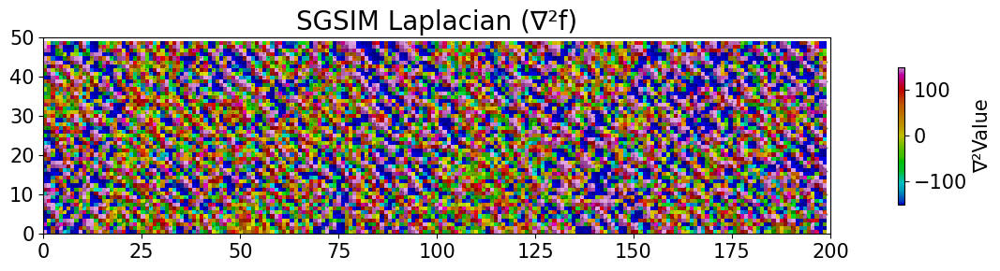

In [270]:
## LAPLACIAN OF SGSIM RESULT (SAVED AS SEPARATE FIGURE) ##
## ===================================================== ##

# grid spacing (same as before)
dx = (extent[1] - extent[0]) / (cols - 1)
dy = (extent[3] - extent[2]) / (rows - 1)

# --- first derivatives ---
df_dy, df_dx = np.gradient(mat, dy, dx)

# --- second derivatives (curvature in x and y) ---
d2f_dyy, _ = np.gradient(df_dy, dy, dx)
_, d2f_dxx = np.gradient(df_dx, dy, dx)

# --- Laplacian: ∇²f = ∂²f/∂x² + ∂²f/∂y² ---
laplacian = d2f_dxx + d2f_dyy

# pick limits (tune as needed)
vmin_l, vmax_l = -150, 150

# shaded relief to match your other figures
rgb_lap = ls.shade(laplacian, cmap=geosoft_cmap, blend_mode='soft',
                   vmin=vmin_l, vmax=vmax_l)

# plot
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_lap, origin='upper', extent=extent)
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))
ax.set_title("SGSIM Laplacian (∇²f)")

# (optional) overlay sample locations
ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

# colorbar
mappable_lap = ScalarMappable(norm=Normalize(vmin=vmin_l, vmax=vmax_l),
                              cmap=geosoft_cmap)
mappable_lap.set_array([])
fig.colorbar(mappable_lap, ax=ax, shrink=0.7, label="∇²Value")

plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_SGSIM_result_laplacian.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)
plt.show()


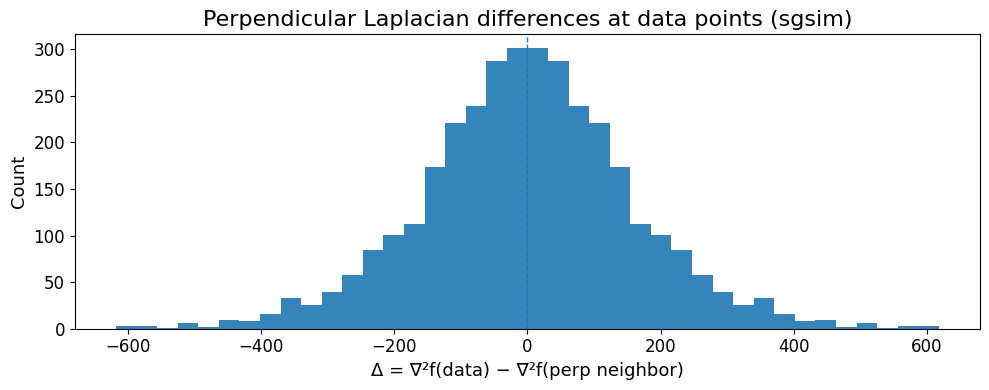

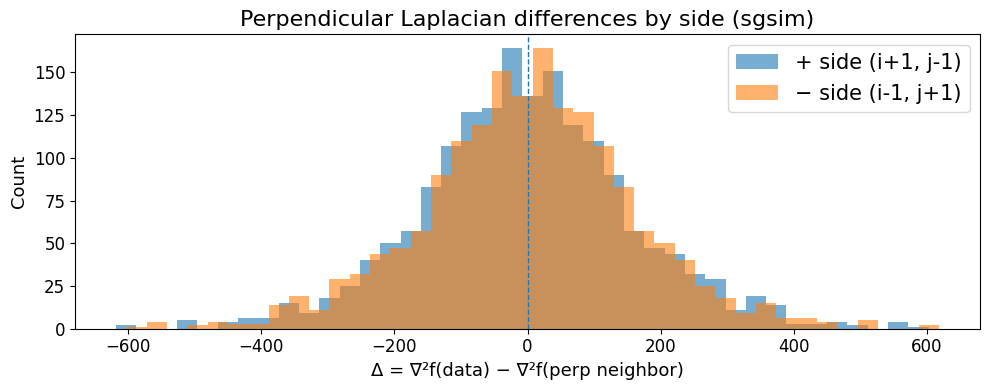

In [271]:
## PERPENDICULAR LAPLACIAN DIFFERENCES AT DATA LOCATIONS + HISTOGRAM ##
## ================================================================= ##

# Assumes:
# - laplacian: 2D array computed above (same shape as mat: (rows, cols))
# - extent = [xmin, xmax, ymin, ymax]
# - rows, cols
# - x_coords, y_coords are your data locations
# - For your Kriging plots you used origin='upper'; we map accordingly.

xmin, xmax, ymin, ymax = extent
dx_pix = (xmax - xmin) / (cols - 1)
dy_pix = (ymax - ymin) / (rows - 1)

def xy_to_ij(x, y):
    """Map world coords to array indices for an imshow(origin='upper') grid."""
    j = int(np.rint((x - xmin) / dx_pix))
    i = int(np.rint((ymax - y) / dy_pix))  # flip y -> row index (top = 0)
    # clip to bounds
    if j < 0 or j >= cols or i < 0 or i >= rows:
        return None
    return i, j

# Perpendicular to 45° lines → use diagonal neighbors (±1, ∓1)
# perp_offsets = [(+1, -1), (-1, +1)]
perp_offsets = [(+1, +1), (-1, -1)]

diffs_all = []
diff_plus = []   # using (+1, -1)
diff_minus = []  # using (-1, +1)

for x, y in zip(x_coords, y_coords):
    idx = xy_to_ij(float(x), float(y))
    if idx is None:
        continue
    i, j = idx
    c = laplacian[i, j]
    if not np.isfinite(c):
        continue

    # (+1, -1)
    ii, jj = i + perp_offsets[0][0], j + perp_offsets[0][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_plus.append(d)

    # (-1, +1)
    ii, jj = i + perp_offsets[1][0], j + perp_offsets[1][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_minus.append(d)

diffs_all_sgsim = np.asarray(diffs_all, dtype=float)
diff_plus  = np.asarray(diff_plus, dtype=float)
diff_minus = np.asarray(diff_minus, dtype=float)

# --- Histogram (combined) ---
plt.rcParams.update({
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diffs_all_sgsim, bins=40, alpha=0.9)
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences at data points (sgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/sgsim_laplacian_perp_diffs_hist.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()

# --- (Optional) Separate histograms for each side ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diff_plus,  bins=40, alpha=0.6, label="+ side (i+1, j-1)")
ax.hist(diff_minus, bins=40, alpha=0.6, label="− side (i-1, j+1)")
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences by side (sgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
ax.legend()
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/sgsim_laplacian_perp_diffs_hist_sides.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()


In [196]:
## LOOP GENERATING SGSIM REALIZATIONS (APPEND TO .nc IF EXISTS) ##
## ============================================================= ##

# --- Inputs assumed available (from your session) ---
# df_fl_xyvctr: DataFrame with columns ['x','y','nval']  (conditioning data)
# Pred_grid_xy: DataFrame with columns ['x','y'] (prediction grid in row-major order)
# rows, cols: grid shape (e.g., 50, 200)
# V1.parameters -> [range, sill, nugget]  (adjust if your order differs)
# nst_trans: fitted NormalScoreTransformer with .inverse_transform()
# gs.Interpolation.okrige_sgs: your SGSIM function
# append_and_overwrite_nc(), get_start_realization(): your helpers

# ------------------------------
# Helpers
# ------------------------------

def append_and_overwrite_nc(existing_fp: str, new_ds: xr.Dataset, append_dim: str):
    """
    Read existing NetCDF if present, concatenate `new_ds` along `append_dim`,
    write to a temp file, then atomically replace the original.
    """
    # Avoid stale open handles
    xr.backends.file_manager.FILE_CACHE.clear()

    # Ensure new_ds is realized and independent of other open files
    new_ds = new_ds.load()

    if os.path.exists(existing_fp):
        with xr.open_dataset(existing_fp) as ds_old:
            ds_old = ds_old.load()
        # Align dim order and coords where possible
        new_ds = new_ds.transpose(*[d for d in ds_old.dims if d in new_ds.dims],
                                  missing_dims="ignore")
        combined = xr.concat([ds_old, new_ds], dim=append_dim)
        combined.attrs.update(ds_old.attrs)
    else:
        combined = new_ds

    # Temp path in same dir for atomic replace
    d = os.path.dirname(existing_fp) or "."
    b = os.path.basename(existing_fp)
    tmp_fp = os.path.join(d, f".{b}.tmp_{datetime.now().strftime('%Y%m%d%H%M%S%f')}")

    # Optional compression for all variables
    encoding = {v: {"zlib": True} for v in combined.data_vars}

    # Write with netCDF4 so we can mark unlimited dims
    combined.to_netcdf(
        tmp_fp,
        engine="netcdf4",
        format="NETCDF4",
        unlimited_dims=[append_dim],
        encoding=encoding,
    )

    # Close references and clear cache before replace
    del combined
    xr.backends.file_manager.FILE_CACHE.clear()

    os.replace(tmp_fp, existing_fp)


def get_start_realization(fp: str, dim: str = "realization") -> int:
    """Return next available realization index from an existing file, else 0."""
    if not os.path.exists(fp):
        return 0
    xr.backends.file_manager.FILE_CACHE.clear()
    with xr.open_dataset(fp) as ds:
        if dim not in ds.sizes or ds.sizes[dim] == 0:
            return 0
        # robust even if realization is a coordinate not equal to arange
        return int(ds[dim].max().values) + 1

## LOOP: SGSIM REALIZATIONS (USING YOUR EXACT RECIPE) ##
## ================================================== ##

# --- config ---
n_new_realz = 82
fp_sgsims_grid_ds = "/Users/jrines/stanford_gp/research/mx/computers_geosciences/results/sgsims_grid.nc"

# grid shape & sanity
rows, cols = 50, 200
if Pred_grid_xy.shape[0] != rows * cols:
    raise ValueError(f"Pred_grid_xy length {Pred_grid_xy.shape[0]} != rows*cols {rows*cols}")

# build x/y coords for nice axes in the file (robust to slight irregularities)
x_flat = Pred_grid_xy[:,0]
y_flat = Pred_grid_xy[:,1]
try:
    x_grid = np.sort(np.unique(x_flat.reshape(rows, cols)[0, :]))
    y_grid = np.sort(np.unique(y_flat.reshape(rows, cols)[:, 0]))
    if x_grid.size != cols or y_grid.size != rows:
        raise RuntimeError
except Exception:
    xmin, xmax = float(x_flat.min()), float(x_flat.max())
    ymin, ymax = float(y_flat.min()), float(y_flat.max())
    x_grid = np.linspace(xmin, xmax, num=cols)
    y_grid = np.linspace(ymin, ymax, num=rows)

# --- variogram & search params (exactly your setup) ---
azimuth = 0
nugget = V1.parameters[2]
major_range = V1.parameters[0]
minor_range = V1.parameters[0]
sill = V1.parameters[1]
vtype = "Exponential"
vario = [azimuth, nugget, major_range, minor_range, sill, vtype]

k = 10          # neighbors
rad = 40        # search radius (same units as x/y)

# --- resume index ---
start_realz = get_start_realization(fp_sgsims_grid_ds, "realization")
print(f"Starting SGSIM realizations from {start_realz}")

# --- loop: generate & append immediately ---
for i in range(start_realz, start_realz + n_new_realz):
    print(f"Generating SGSIM realization {i}")

    # ===== YOUR EXACT ONE-REALIZATION RECIPE =====
    rng = np.random.default_rng(i)  # per-realization seed for reproducibility
    sim = gs.Interpolation.okrige_sgs(
        Pred_grid_xy, df_fl_xyvctr, "x", "y", "nval", k, vario, rad, seed=rng
    )
    sim1 = sim.reshape(-1, 1)
    sim_trans = nst_trans.inverse_transform(sim1)
    # =============================================

    # reshape to (rows, cols)
    sim_norm_grid = sim.reshape(rows, cols)
    sim_trans_grid = sim_trans.reshape(rows, cols)

    # package to xarray: dims (realization, y, x) — no expand_dims needed
    ds_i = xr.Dataset(
        data_vars=dict(
            sim_norm=(("realization", "y", "x"), sim_norm_grid[None, :, :]),
            sim_trans=(("realization", "y", "x"), sim_trans_grid[None, :, :]),
        ),
        coords=dict(
            realization=[i],
            x=x_grid,
            y=y_grid,
        ),
        attrs=dict(
            method="SGSIM (OK-based)",
            neighbors=k,
            search_radius=rad,
            variogram_type=vtype,
            variogram_azimuth=azimuth,
            variogram_major_range=float(major_range),
            variogram_minor_range=float(minor_range),
            variogram_sill=float(sill),
            variogram_nugget=float(nugget),
            note="sim_norm is Gaussian; sim_trans is back-transformed via nst_trans",
        ),
    )
    # (optional) enforce dim order
    ds_i = ds_i.transpose("realization", "y", "x")


    append_and_overwrite_nc(fp_sgsims_grid_ds, ds_i, append_dim="realization")

# --- report total ---
with xr.open_dataset(fp_sgsims_grid_ds) as _tmp:
    total = int(_tmp.sizes.get("realization", 0))
print(f"Total SGSIM realizations now: {total}")




Starting SGSIM realizations from 118
Generating SGSIM realization 118


100%|██████████| 10000/10000 [00:21<00:00, 457.15it/s]


Generating SGSIM realization 119


100%|██████████| 10000/10000 [00:22<00:00, 450.66it/s]


Generating SGSIM realization 120


100%|██████████| 10000/10000 [00:22<00:00, 451.43it/s]


Generating SGSIM realization 121


100%|██████████| 10000/10000 [00:22<00:00, 447.75it/s]


Generating SGSIM realization 122


100%|██████████| 10000/10000 [00:22<00:00, 450.19it/s]


Generating SGSIM realization 123


100%|██████████| 10000/10000 [00:22<00:00, 453.76it/s]


Generating SGSIM realization 124


100%|██████████| 10000/10000 [00:20<00:00, 480.26it/s]


Generating SGSIM realization 125


100%|██████████| 10000/10000 [00:21<00:00, 462.10it/s]


Generating SGSIM realization 126


100%|██████████| 10000/10000 [00:21<00:00, 460.20it/s]


Generating SGSIM realization 127


100%|██████████| 10000/10000 [00:22<00:00, 448.90it/s]


Generating SGSIM realization 128


100%|██████████| 10000/10000 [00:21<00:00, 460.74it/s]


Generating SGSIM realization 129


100%|██████████| 10000/10000 [00:21<00:00, 460.36it/s]


Generating SGSIM realization 130


100%|██████████| 10000/10000 [00:21<00:00, 462.01it/s]


Generating SGSIM realization 131


100%|██████████| 10000/10000 [00:21<00:00, 460.34it/s]


Generating SGSIM realization 132


100%|██████████| 10000/10000 [00:22<00:00, 451.67it/s]


Generating SGSIM realization 133


100%|██████████| 10000/10000 [00:23<00:00, 432.03it/s]


Generating SGSIM realization 134


100%|██████████| 10000/10000 [00:21<00:00, 474.90it/s]


Generating SGSIM realization 135


100%|██████████| 10000/10000 [00:21<00:00, 462.67it/s]


Generating SGSIM realization 136


100%|██████████| 10000/10000 [00:20<00:00, 478.52it/s]


Generating SGSIM realization 137


100%|██████████| 10000/10000 [00:20<00:00, 481.33it/s]


Generating SGSIM realization 138


100%|██████████| 10000/10000 [00:20<00:00, 482.07it/s]


Generating SGSIM realization 139


100%|██████████| 10000/10000 [00:20<00:00, 480.58it/s]


Generating SGSIM realization 140


100%|██████████| 10000/10000 [00:20<00:00, 482.34it/s]


Generating SGSIM realization 141


100%|██████████| 10000/10000 [00:20<00:00, 481.07it/s]


Generating SGSIM realization 142


100%|██████████| 10000/10000 [00:21<00:00, 473.50it/s]


Generating SGSIM realization 143


100%|██████████| 10000/10000 [00:20<00:00, 480.81it/s]


Generating SGSIM realization 144


100%|██████████| 10000/10000 [00:20<00:00, 481.94it/s]


Generating SGSIM realization 145


100%|██████████| 10000/10000 [00:20<00:00, 480.43it/s]


Generating SGSIM realization 146


100%|██████████| 10000/10000 [00:20<00:00, 482.09it/s]


Generating SGSIM realization 147


100%|██████████| 10000/10000 [00:20<00:00, 481.18it/s]


Generating SGSIM realization 148


100%|██████████| 10000/10000 [00:20<00:00, 479.08it/s]


Generating SGSIM realization 149


100%|██████████| 10000/10000 [00:20<00:00, 481.46it/s]


Generating SGSIM realization 150


100%|██████████| 10000/10000 [00:20<00:00, 479.97it/s]


Generating SGSIM realization 151


100%|██████████| 10000/10000 [00:20<00:00, 480.79it/s]


Generating SGSIM realization 152


100%|██████████| 10000/10000 [00:20<00:00, 480.59it/s]


Generating SGSIM realization 153


100%|██████████| 10000/10000 [00:20<00:00, 480.14it/s]


Generating SGSIM realization 154


100%|██████████| 10000/10000 [00:20<00:00, 481.12it/s]


Generating SGSIM realization 155


100%|██████████| 10000/10000 [00:20<00:00, 482.39it/s]


Generating SGSIM realization 156


100%|██████████| 10000/10000 [00:20<00:00, 480.67it/s]


Generating SGSIM realization 157


100%|██████████| 10000/10000 [00:20<00:00, 479.68it/s]


Generating SGSIM realization 158


100%|██████████| 10000/10000 [00:20<00:00, 481.03it/s]


Generating SGSIM realization 159


100%|██████████| 10000/10000 [00:20<00:00, 480.46it/s]


Generating SGSIM realization 160


100%|██████████| 10000/10000 [00:20<00:00, 481.88it/s]


Generating SGSIM realization 161


100%|██████████| 10000/10000 [00:20<00:00, 481.61it/s]


Generating SGSIM realization 162


100%|██████████| 10000/10000 [00:20<00:00, 478.83it/s]


Generating SGSIM realization 163


100%|██████████| 10000/10000 [00:20<00:00, 480.05it/s]


Generating SGSIM realization 164


100%|██████████| 10000/10000 [00:20<00:00, 480.60it/s]


Generating SGSIM realization 165


100%|██████████| 10000/10000 [00:20<00:00, 478.32it/s]


Generating SGSIM realization 166


100%|██████████| 10000/10000 [00:20<00:00, 481.38it/s]


Generating SGSIM realization 167


100%|██████████| 10000/10000 [00:20<00:00, 481.14it/s]


Generating SGSIM realization 168


100%|██████████| 10000/10000 [00:20<00:00, 481.12it/s]


Generating SGSIM realization 169


100%|██████████| 10000/10000 [00:20<00:00, 479.48it/s]


Generating SGSIM realization 170


100%|██████████| 10000/10000 [00:20<00:00, 481.46it/s]


Generating SGSIM realization 171


100%|██████████| 10000/10000 [00:20<00:00, 481.61it/s]


Generating SGSIM realization 172


100%|██████████| 10000/10000 [00:20<00:00, 479.88it/s]


Generating SGSIM realization 173


100%|██████████| 10000/10000 [00:20<00:00, 480.75it/s]


Generating SGSIM realization 174


100%|██████████| 10000/10000 [00:20<00:00, 481.46it/s]


Generating SGSIM realization 175


100%|██████████| 10000/10000 [00:20<00:00, 481.77it/s]


Generating SGSIM realization 176


100%|██████████| 10000/10000 [00:20<00:00, 479.43it/s]


Generating SGSIM realization 177


100%|██████████| 10000/10000 [00:20<00:00, 481.97it/s]


Generating SGSIM realization 178


100%|██████████| 10000/10000 [00:20<00:00, 478.92it/s]


Generating SGSIM realization 179


100%|██████████| 10000/10000 [00:20<00:00, 481.61it/s]


Generating SGSIM realization 180


100%|██████████| 10000/10000 [00:20<00:00, 480.30it/s]


Generating SGSIM realization 181


100%|██████████| 10000/10000 [00:20<00:00, 480.87it/s]


Generating SGSIM realization 182


100%|██████████| 10000/10000 [00:20<00:00, 480.61it/s]


Generating SGSIM realization 183


100%|██████████| 10000/10000 [00:20<00:00, 479.63it/s]


Generating SGSIM realization 184


100%|██████████| 10000/10000 [00:20<00:00, 478.36it/s]


Generating SGSIM realization 185


100%|██████████| 10000/10000 [00:20<00:00, 478.11it/s]


Generating SGSIM realization 186


100%|██████████| 10000/10000 [00:20<00:00, 481.86it/s]


Generating SGSIM realization 187


100%|██████████| 10000/10000 [00:20<00:00, 480.25it/s]


Generating SGSIM realization 188


100%|██████████| 10000/10000 [00:20<00:00, 481.39it/s]


Generating SGSIM realization 189


100%|██████████| 10000/10000 [00:20<00:00, 481.89it/s]


Generating SGSIM realization 190


100%|██████████| 10000/10000 [00:20<00:00, 479.30it/s]


Generating SGSIM realization 191


100%|██████████| 10000/10000 [00:20<00:00, 481.30it/s]


Generating SGSIM realization 192


100%|██████████| 10000/10000 [00:20<00:00, 481.72it/s]


Generating SGSIM realization 193


100%|██████████| 10000/10000 [00:22<00:00, 440.60it/s]


Generating SGSIM realization 194


100%|██████████| 10000/10000 [03:31<00:00, 47.36it/s] 


Generating SGSIM realization 195


100%|██████████| 10000/10000 [15:45<00:00, 10.58it/s] 


Generating SGSIM realization 196


100%|██████████| 10000/10000 [1:05:53<00:00,  2.53it/s] 


Generating SGSIM realization 197


100%|██████████| 10000/10000 [15:39<00:00, 10.64it/s] 


Generating SGSIM realization 198


100%|██████████| 10000/10000 [37:24<00:00,  4.45it/s] 


Generating SGSIM realization 199


100%|██████████| 10000/10000 [1:07:25<00:00,  2.47it/s]


Total SGSIM realizations now: 200


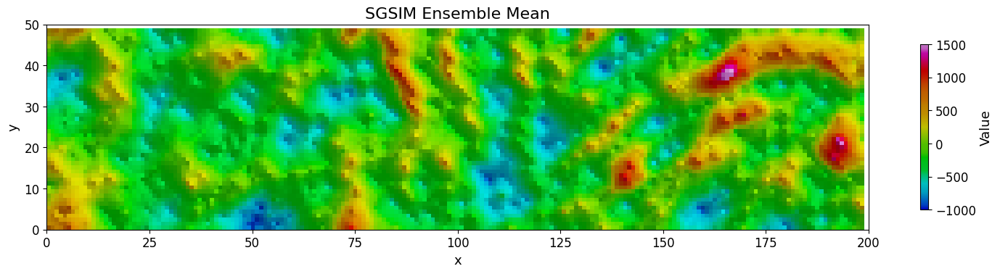

In [333]:
## ENSEMBLE MEAN AND VARIANCE ##
## ========================== ##

# load sgsim ensemble:
fp_sgsims_grid_ds = '/Users/jrines/stanford_gp/research/mx/computers_geosciences/results/sgsims_grid.nc'
sgsims_grid_ds = xr.open_dataset(fp_sgsims_grid_ds)

trend = sgsims_grid_ds["sim_trans"]

# mask cells that have at least 1 sample
valid = trend.count("realization") > 0

ensemble_mean = trend.where(valid).mean("realization", skipna=True)
ensemble_var  = trend.where(valid).var ("realization", skipna=True, ddof=0)

# reshape to grid
rows = 50
cols = 200
mean_grid = ensemble_mean.values.reshape(rows, cols)
var_grid = ensemble_var.values.reshape(rows, cols)
mean_grid.shape

## PLOT OF ENSEMBLE MEAN ##
## ===================== ##
fig, ax = plt.subplots(figsize=(15, 6))
rgb = ls.shade(mean_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
ax.imshow(rgb, origin='upper', extent=extent)

sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
sm.set_array([])
fig.colorbar(sm, ax=ax, shrink=0.4, label='Value')

# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

ax.set_title("SGSIM Ensemble Mean")
ax.set_xlabel("x")
ax.set_ylabel("y")

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

plt.tight_layout()

# save clean image
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/grid_sgsim_mean.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()



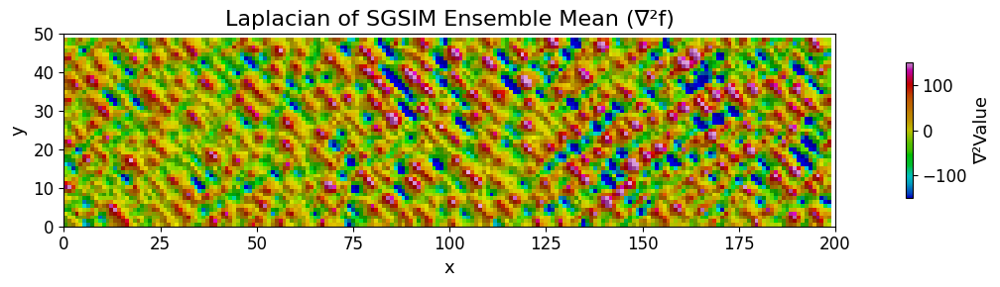

In [334]:
## LAPLACIAN OF SGSIM RESULT (SAVED AS SEPARATE FIGURE) ##
## ===================================================== ##

mat = mean_grid

# grid spacing (same as before)
dx = (extent[1] - extent[0]) / (cols - 1)
dy = (extent[3] - extent[2]) / (rows - 1)

# --- first derivatives ---
df_dy, df_dx = np.gradient(mat, dy, dx)

# --- second derivatives (curvature in x and y) ---
d2f_dyy, _ = np.gradient(df_dy, dy, dx)
_, d2f_dxx = np.gradient(df_dx, dy, dx)

# --- Laplacian: ∇²f = ∂²f/∂x² + ∂²f/∂y² ---
laplacian = d2f_dxx + d2f_dyy

# pick limits (tune as needed)
vmin_l, vmax_l = -150, 150

# shaded relief to match your other figures
rgb_lap = ls.shade(laplacian, cmap=geosoft_cmap, blend_mode='soft',
                   vmin=vmin_l, vmax=vmax_l)

# plot
fig, ax = plt.subplots(figsize=(15, 3))
ax.imshow(rgb_lap, origin='upper', extent=extent)
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))
ax.set_title("Laplacian of SGSIM Ensemble Mean (∇²f)")
ax.set_xlabel("x")
ax.set_ylabel("y")

# (optional) overlay sample locations
# ax.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

# colorbar
mappable_lap = ScalarMappable(norm=Normalize(vmin=vmin_l, vmax=vmax_l),
                              cmap=geosoft_cmap)
mappable_lap.set_array([])
fig.colorbar(mappable_lap, ax=ax, shrink=0.7, label="∇²Value")

plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/compare_SGSIM_ensemble_result_laplacian.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)
plt.show()


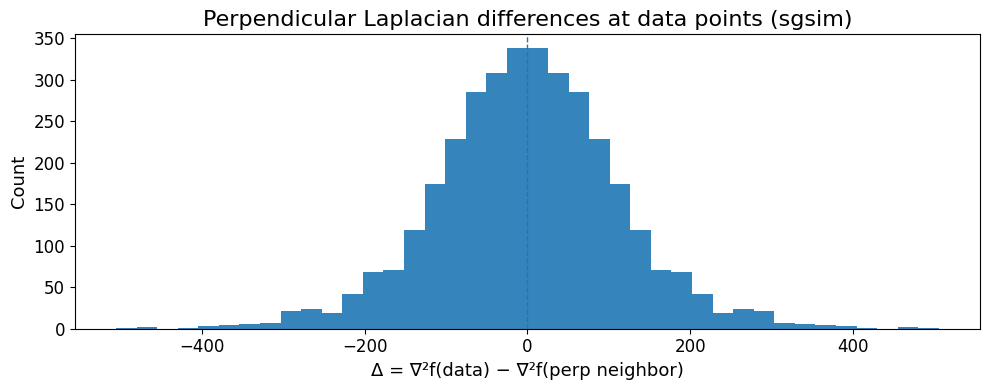

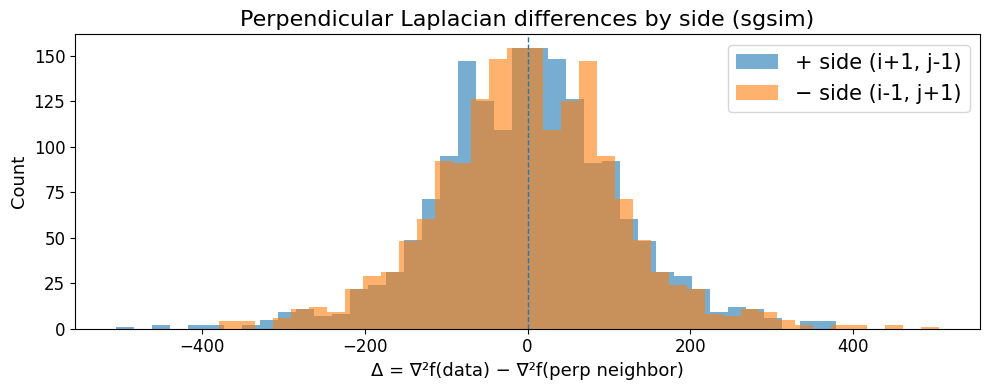

In [335]:
## PERPENDICULAR LAPLACIAN DIFFERENCES AT DATA LOCATIONS + HISTOGRAM ##
## ================================================================= ##

# Assumes:
# - laplacian: 2D array computed above (same shape as mat: (rows, cols))
# - extent = [xmin, xmax, ymin, ymax]
# - rows, cols
# - x_coords, y_coords are your data locations
# - For your Kriging plots you used origin='upper'; we map accordingly.

xmin, xmax, ymin, ymax = extent
dx_pix = (xmax - xmin) / (cols - 1)
dy_pix = (ymax - ymin) / (rows - 1)

def xy_to_ij(x, y):
    """Map world coords to array indices for an imshow(origin='upper') grid."""
    j = int(np.rint((x - xmin) / dx_pix))
    i = int(np.rint((ymax - y) / dy_pix))  # flip y -> row index (top = 0)
    # clip to bounds
    if j < 0 or j >= cols or i < 0 or i >= rows:
        return None
    return i, j

# Perpendicular to 45° lines → use diagonal neighbors (±1, ∓1)
# perp_offsets = [(+1, -1), (-1, +1)]
perp_offsets = [(+1, +1), (-1, -1)]

diffs_all = []
diff_plus = []   # using (+1, -1)
diff_minus = []  # using (-1, +1)

for x, y in zip(x_coords, y_coords):
    idx = xy_to_ij(float(x), float(y))
    if idx is None:
        continue
    i, j = idx
    c = laplacian[i, j]
    if not np.isfinite(c):
        continue

    # (+1, -1)
    ii, jj = i + perp_offsets[0][0], j + perp_offsets[0][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_plus.append(d)

    # (-1, +1)
    ii, jj = i + perp_offsets[1][0], j + perp_offsets[1][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_minus.append(d)

diffs_all_sgsim = np.asarray(diffs_all, dtype=float)
diff_plus  = np.asarray(diff_plus, dtype=float)
diff_minus = np.asarray(diff_minus, dtype=float)

# --- Histogram (combined) ---
plt.rcParams.update({
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diffs_all_sgsim, bins=40, alpha=0.9)
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences at data points (sgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/sgsim_ensemble_laplacian_perp_diffs_hist.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()

# --- (Optional) Separate histograms for each side ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diff_plus,  bins=40, alpha=0.6, label="+ side (i+1, j-1)")
ax.hist(diff_minus, bins=40, alpha=0.6, label="− side (i-1, j+1)")
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences by side (sgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
ax.legend()
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/sgsim_ensemble_laplacian_perp_diffs_hist_sides.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()


## Generate ensemble of MG realizations

In [488]:
# ------------------------------
# Helpers
# ------------------------------

def append_and_overwrite_nc(existing_fp: str, new_ds: xr.Dataset, append_dim: str):
    """
    Read existing NetCDF if present, concatenate `new_ds` along `append_dim`,
    write to a temp file, then atomically replace the original.
    """
    # Avoid stale open handles
    xr.backends.file_manager.FILE_CACHE.clear()

    # Ensure new_ds is realized and independent of other open files
    new_ds = new_ds.load()

    if os.path.exists(existing_fp):
        with xr.open_dataset(existing_fp) as ds_old:
            ds_old = ds_old.load()
        # Align dim order and coords where possible
        new_ds = new_ds.transpose(*[d for d in ds_old.dims if d in new_ds.dims],
                                  missing_dims="ignore")
        combined = xr.concat([ds_old, new_ds], dim=append_dim)
        combined.attrs.update(ds_old.attrs)
    else:
        combined = new_ds

    # Temp path in same dir for atomic replace
    d = os.path.dirname(existing_fp) or "."
    b = os.path.basename(existing_fp)
    tmp_fp = os.path.join(d, f".{b}.tmp_{datetime.now().strftime('%Y%m%d%H%M%S%f')}")

    # Optional compression for all variables
    encoding = {v: {"zlib": True} for v in combined.data_vars}

    # Write with netCDF4 so we can mark unlimited dims
    combined.to_netcdf(
        tmp_fp,
        engine="netcdf4",
        format="NETCDF4",
        unlimited_dims=[append_dim],
        encoding=encoding,
    )

    # Close references and clear cache before replace
    del combined
    xr.backends.file_manager.FILE_CACHE.clear()

    os.replace(tmp_fp, existing_fp)


def get_start_realization(fp: str, dim: str = "realization") -> int:
    """Return next available realization index from an existing file, else 0."""
    if not os.path.exists(fp):
        return 0
    xr.backends.file_manager.FILE_CACHE.clear()
    with xr.open_dataset(fp) as ds:
        if dim not in ds.sizes or ds.sizes[dim] == 0:
            return 0
        # robust even if realization is a coordinate not equal to arange
        return int(ds[dim].max().values) + 1

In [490]:
## LOOP GENERATING REALIZATIONS (ADD TO EXISTING ENSEMBLE .nc FILES IF EXIST) ##
## ========================================================================== ##

# Number of new realizations to generate
n_new_realz = 200

# define the resolutions to use for the MultiGrid simulation iterations
mg_resols = [5,4,3,2,1]

# define the dataframes for grid and observation points
df_grid = df_xyvtcs

# Output files
fp_mgsims_grid_ds = '/Users/jrines/stanford_gp/research/mx/computers_geosciences/results/mgsims_grid_redo.nc'

# Determine starting realization index (resume safely)
start_realz = get_start_realization(fp_mgsims_grid_ds, "realization")
print(f"Starting new realizations from {start_realz}")

# Generate and append each realization immediately (no big in-memory dataset)
for i in range(start_realz, start_realz + n_new_realz):
    print(f"Generating realization {i}")

    # --- Run your simulation (unchanged) ---
    mgsim_grid = mgsim(
        mg_resols, df_grid, df_gamma,
        xx='x', yy='y', zz='residual', kk='cluster',
        num_points=10, radius=40
    )

    # Convert to xarray and tag the realization
    grid_xr = mgsim_grid.to_xarray().expand_dims('realization')
    grid_xr['realization'] = [i]

    # Append to each file and overwrite atomically
    append_and_overwrite_nc(fp_mgsims_grid_ds, grid_xr, append_dim='realization')

# Report total realizations (read once, then close)
with xr.open_dataset(fp_mgsims_grid_ds) as _tmp:
    total = int(_tmp.sizes.get('realization', 0))
print(f"Total realizations now: {total}")


Starting new realizations from 0
Generating realization 0
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:28<00:00, 354.14it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:27<00:00, 361.49it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 389.40it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:24<00:00, 414.28it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:24<00:00, 414.52it/s]


Generating realization 1
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 364.82it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 371.81it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 390.46it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:24<00:00, 415.62it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:24<00:00, 400.88it/s]


Generating realization 2
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 357.60it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:27<00:00, 368.93it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 390.22it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:24<00:00, 414.65it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 419.90it/s]


Generating realization 3
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 366.99it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 376.96it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 393.02it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:23<00:00, 419.98it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 420.90it/s]


Generating realization 4
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 362.60it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 376.00it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 395.41it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:23<00:00, 421.13it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 418.69it/s]


Generating realization 5
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 366.26it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 376.50it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 397.13it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:23<00:00, 421.15it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 420.27it/s]


Generating realization 6
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 360.63it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 372.51it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 395.55it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:23<00:00, 422.63it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 419.37it/s]


Generating realization 7
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 368.34it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 376.47it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 395.19it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [13:38<00:00, 12.22it/s] 


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [09:53<00:00, 16.84it/s] 


Generating realization 8
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 362.47it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 372.54it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 393.31it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:24<00:00, 400.47it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 420.98it/s]


Generating realization 9
MultiGrid iteration 1: Processing resolution 5


100%|██████████| 10000/10000 [00:27<00:00, 367.30it/s]


MultiGrid iteration 2: Processing resolution 4


100%|██████████| 10000/10000 [00:26<00:00, 377.75it/s]


MultiGrid iteration 3: Processing resolution 3


100%|██████████| 10000/10000 [00:25<00:00, 384.88it/s]


MultiGrid iteration 4: Processing resolution 2


100%|██████████| 10000/10000 [00:23<00:00, 420.16it/s]


MultiGrid iteration 5: Processing resolution 1


100%|██████████| 10000/10000 [00:23<00:00, 421.72it/s]


Generating realization 10
MultiGrid iteration 1: Processing resolution 5


 21%|██        | 2051/10000 [00:05<00:20, 389.90it/s]


KeyboardInterrupt: 

## Load ensemble .nc file(s)

In [286]:
## LOAD .nc ENSEMBLE FILE ##
## ====================== ##

# file paths to .nc files containing ensembles
fp_mgsims_grid_ds = '/Users/jrines/stanford_gp/research/mx/computers_geosciences/results/mgsim_realz_5k.nc'

# load ensembles
mgsims_grid_ds = xr.open_dataset(fp_mgsims_grid_ds)

mgsims_grid_ds


<xarray.Dataset> Size: 3GB
Dimensions:      (realization: 5000, index: 10000)
Coordinates:
  * index        (index) int64 80kB 0 1 2 3 4 5 ... 9995 9996 9997 9998 9999
  * realization  (realization) int64 40kB 0 1 2 3 4 ... 4995 4996 4997 4998 4999
Data variables:
    x            (realization, index) float64 400MB ...
    y            (realization, index) float64 400MB ...
    value        (realization, index) float64 400MB ...
    trend        (realization, index) float64 400MB ...
    cluster      (realization, index) float64 400MB ...
    set          (realization, index) int8 50MB ...
    residual     (realization, index) float64 400MB ...
    newtrend     (realization, index) float64 400MB ...

## Visualize MGSIM ensemble (e.g., mean and variance)

In [287]:
# # Create a dataset with all ensemble statistics
# ensemble_stats = xr.Dataset({
#     'mean': mgsims_grid_ds.mean(dim='realization'),
#     'std': mgsims_grid_ds.std(dim='realization'),
#     'var': mgsims_grid_ds.var(dim='realization'),
#     'min': mgsims_grid_ds.min(dim='realization'),
#     'max': mgsims_grid_ds.max(dim='realization'),
#     'p10': mgsims_grid_ds.quantile(0.1, dim='realization'),
#     'p90': mgsims_grid_ds.quantile(0.9, dim='realization')
# })

# print(ensemble_stats)

In [288]:
## ENSEMBLE MEAN AND VARIANCE ##
## ========================== ##

trend = mgsims_grid_ds["newtrend"]

# mask cells that have at least 1 sample
valid = trend.count("realization") > 0

ensemble_mean = trend.where(valid).mean("realization", skipna=True)
ensemble_var  = trend.where(valid).var ("realization", skipna=True, ddof=0)

# reshape to grid
rows = 50
cols = 200
mean_grid = ensemble_mean.values.reshape(rows, cols)
var_grid = ensemble_var.values.reshape(rows, cols)
mean_grid.shape



(50, 200)

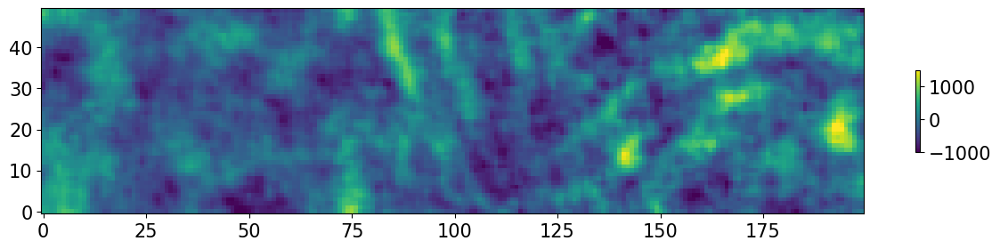

In [289]:
plt.figure(figsize=(15,3))
plt.imshow(mgsims_grid_ds["newtrend"][50].values.reshape(rows, cols), origin='lower')
plt.colorbar(shrink=0.4)
plt.clim(-1000,1500)

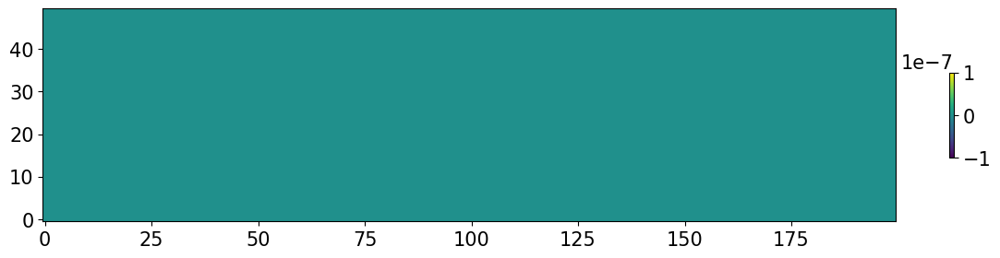

In [290]:
idx1 = 999
idx2 = 999
realz1 = mgsims_grid_ds["newtrend"][idx1].values.reshape(rows, cols)
realz2 = mgsims_grid_ds["newtrend"][idx2].values.reshape(rows, cols)

plt.figure(figsize=(15,3))
plt.imshow(realz1-realz2, origin='lower')
plt.colorbar(shrink=0.4)
plt.clim(-0.0000001,0.0000001)

In [291]:
realiz_grid = mgsims_grid_ds["newtrend"][50].values.reshape(rows, cols)
realiz_lap = laplacian_2d(realiz_grid, dx, dy)

plt.figure(figsize=(15,3))
plt.imshow(realiz_lap, origin='lower')
plt.colorbar(shrink=0.4)
plt.clim(-250,250)

NameError: name 'laplacian_2d' is not defined

In [ ]:
## LOAD FLIGHTLINES, GROUNDTRUTH, AND CLUSTER CONTOURS ##
## =================================================== ##

## GROUND TRUTH 
rows = 50
cols = 200
df_loaded = pd.read_csv('/Users/jrines/stanford_gp/research/mx/computers_geosciences/data/gt_xyvc.csv')
gt_xyvc = df_loaded.values
ground_truth = gt_xyvc[:,2].reshape(rows, cols)

## fl_xyvc
fl_xyvc = np.loadtxt(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/data/fl_xyvc.csv",
    delimiter=",",
    skiprows=1)


## CONTOURS BETWEEN CLUSTERS
contours_by_cluster = {}
labels_grid = gt_xyvc[:, 3].reshape(rows, cols)
for k in np.unique(labels_grid):
    mask = (labels_grid == k).astype(float)     # binary mask for cluster k
    # find_contours returns arrays of shape (N, 2) in (row, col) coordinates
    conts = find_contours(mask, level=0.5)
    # optional: drop tiny fragments
    conts = [c for c in conts if c.shape[0] >= 10]
    contours_by_cluster[int(k)] = conts



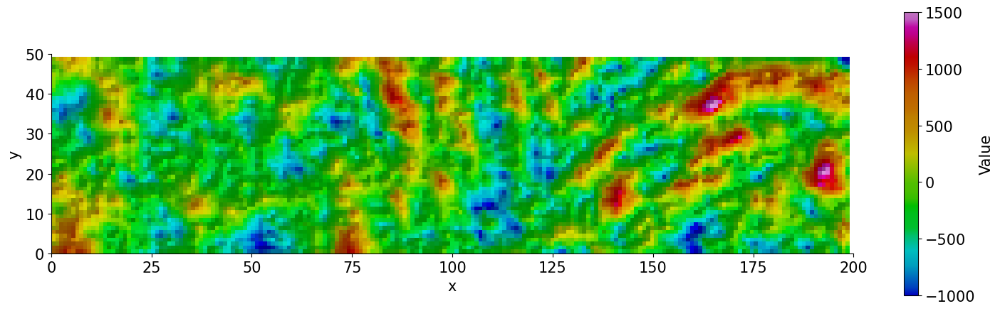

In [292]:
## PLOT ONE MGSIM REALIZATION ##
## ========================== ##

idx_realiz = 2
realiz_grid = mgsims_grid_ds["newtrend"][idx_realiz].values.reshape(rows, cols)
fig, ax = plt.subplots(figsize=(15, 6))
rgb = ls.shade(realiz_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
ax.imshow(rgb, origin='lower', extent=extent)

sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
sm.set_array([])
fig.colorbar(sm, ax=ax, shrink=0.7, label='Value')

# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

plt.rcParams.update({
    "axes.titlesize": 25,
    "axes.labelsize": 20,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 20,
})

# ax.set_title(f"Realization {idx_realiz}")
ax.set_xlabel("x")
ax.set_ylabel("y")

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

# save to PNG (high resolution, transparent background, trimmed)
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/realization_{idx_realiz}_grid.png",
    dpi=300, bbox_inches="tight", transparent=True
)

plt.show()


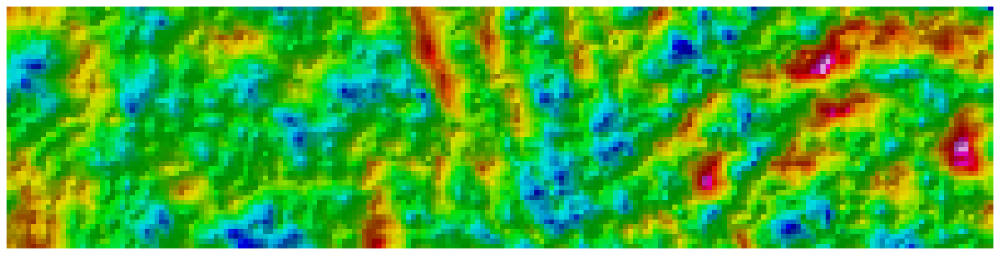

In [293]:
## PLOT ONE MGSIM REALIZATION (CLEAN VERSION) ##
## =========================================== ##

idx_realiz = 50
realiz_grid = mgsims_grid_ds["newtrend"][idx_realiz].values.reshape(rows, cols)

fig, ax = plt.subplots(figsize=(15, 6))

rgb = ls.shade(realiz_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
ax.imshow(rgb, origin='lower', extent=extent)

# remove all axes, ticks, spines, labels
ax.set_axis_off()
ax.set_xticks([])
ax.set_yticks([])
for spine in ax.spines.values():
    spine.set_visible(False)

# no title, no colorbar, no margins
plt.tight_layout(pad=0)
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

# save clean image
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/realization_{idx_realiz}_grid_noaxes.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()


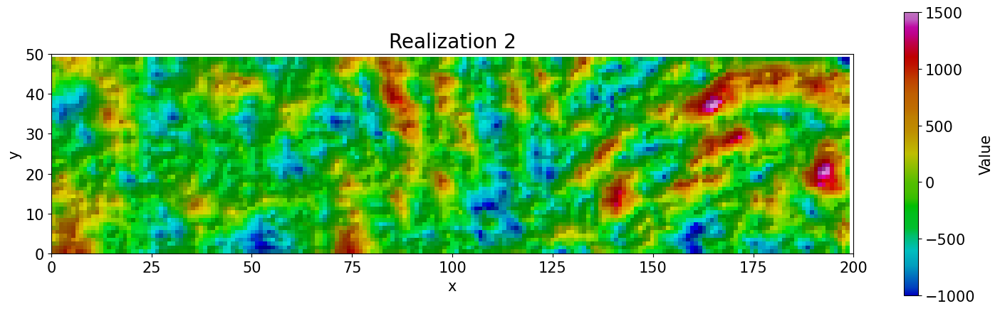

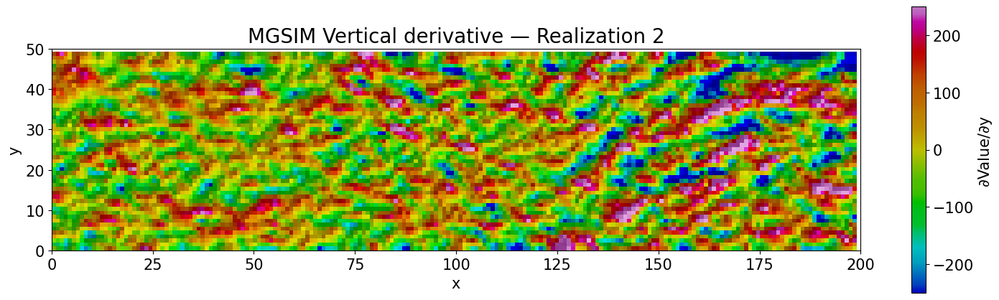

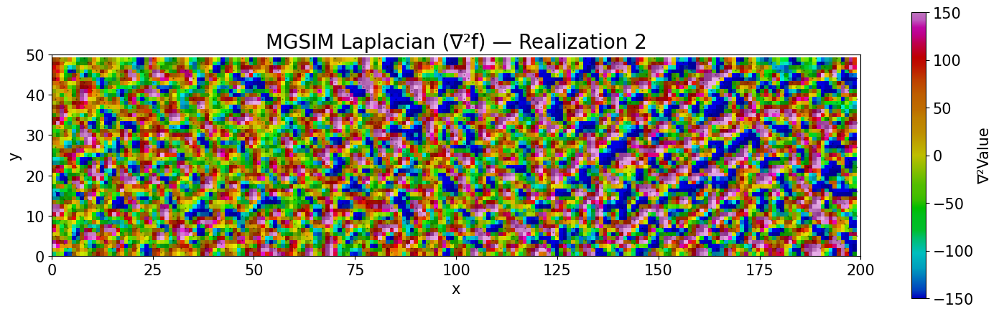

In [294]:
## PLOT ONE MGSIM REALIZATION + ITS VERTICAL DERIVATIVE ##
## ===================================================== ##

idx_realiz = 2
realiz_grid = mgsims_grid_ds["newtrend"][idx_realiz].values.reshape(rows, cols)

# --- compute vertical derivative (∂/∂y) ---
dy = (extent[3] - extent[2]) / (rows - 1)
vert_deriv = np.gradient(realiz_grid, dy, axis=0)

plt.rcParams.update({
    "axes.titlesize": 20,
    "axes.labelsize": 15,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "legend.fontsize": 15,
})

# ======================
# 1. Save realization
# ======================
fig1, ax1 = plt.subplots(figsize=(15, 6))
rgb = ls.shade(realiz_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
ax1.imshow(rgb, origin='lower', extent=extent)

sm1 = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
fig1.colorbar(sm1, ax=ax1, shrink=0.7, label='Value')

ax1.set_title(f"Realization {idx_realiz}")
ax1.set_xlabel("x")
ax1.set_ylabel("y")
ax1.set_xlim(0, 200)
ax1.set_ylim(0, 50)
ax1.set_xticks(np.arange(0, 201, 25))
ax1.set_yticks(np.arange(0, 51, 10))

plt.tight_layout()
fig1.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/realization_{idx_realiz}_grid.png",
    dpi=300, bbox_inches="tight", transparent=True
)

# ======================
# 2. Save vertical derivative
# ======================
vmin_d, vmax_d = -250, 250
fig2, ax2 = plt.subplots(figsize=(15, 6))
rgb_d = ls.shade(vert_deriv, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin_d, vmax=vmax_d)
ax2.imshow(rgb_d, origin='lower', extent=extent)

sm2 = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin_d, vmax=vmax_d), cmap=geosoft_cmap)
fig2.colorbar(sm2, ax=ax2, shrink=0.7, label='∂Value/∂y')

ax2.set_title(f"MGSIM Vertical derivative — Realization {idx_realiz}")
ax2.set_xlabel("x")
ax2.set_ylabel("y")
ax2.set_xlim(0, 200)
ax2.set_ylim(0, 50)
ax2.set_xticks(np.arange(0, 201, 25))
ax2.set_yticks(np.arange(0, 51, 10))

plt.tight_layout()
fig2.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/realization_{idx_realiz}_dy.png",
    dpi=300, bbox_inches="tight", transparent=True
)

# ======================
# 3. Save Laplacian (∇²f)
# ======================
# grid spacing
dx = (extent[1] - extent[0]) / (cols - 1)
dy = (extent[3] - extent[2]) / (rows - 1)

# first derivatives
df_dy, df_dx = np.gradient(realiz_grid, dy, dx)
# second derivatives
d2f_dyy, _ = np.gradient(df_dy, dy, dx)
_, d2f_dxx = np.gradient(df_dx, dy, dx)
laplacian = d2f_dxx + d2f_dyy

# robust color limits
vmin_l, vmax_l = -150, 150

fig3, ax3 = plt.subplots(figsize=(15, 6))
rgb_lap = ls.shade(laplacian, cmap=geosoft_cmap, blend_mode='soft',
                   vmin=vmin_l, vmax=vmax_l)
ax3.imshow(rgb_lap, origin='lower', extent=extent)

sm3 = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin_l, vmax=vmax_l), cmap=geosoft_cmap)
fig3.colorbar(sm3, ax=ax3, shrink=0.7, label='∇²Value')

ax3.set_title(f"MGSIM Laplacian (∇²f) — Realization {idx_realiz}")
ax3.set_xlabel("x")
ax3.set_ylabel("y")
ax3.set_xlim(0, 200)
ax3.set_ylim(0, 50)
ax3.set_xticks(np.arange(0, 201, 25))
ax3.set_yticks(np.arange(0, 51, 10))

# (optional) overlay sample locations
ax3.scatter(x_coords, y_coords, s=2, c='k', alpha=0.5, linewidths=0, rasterized=True)

plt.tight_layout()
fig3.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/realization_{idx_realiz}_laplacian.png",
    dpi=300, bbox_inches="tight", transparent=True
)




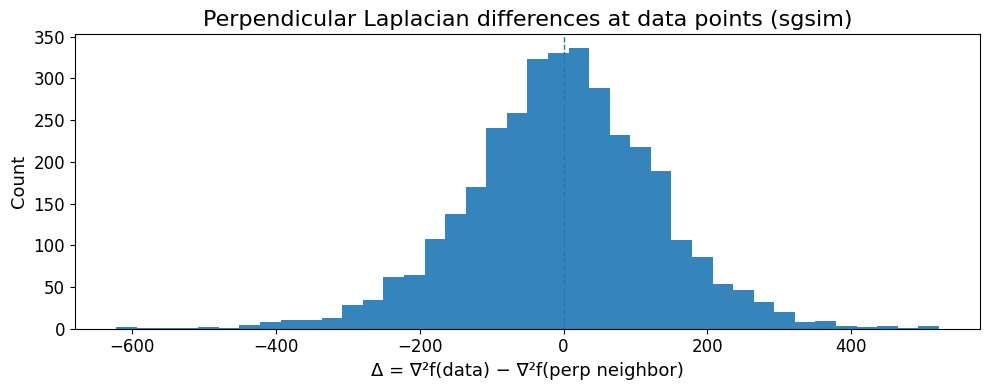

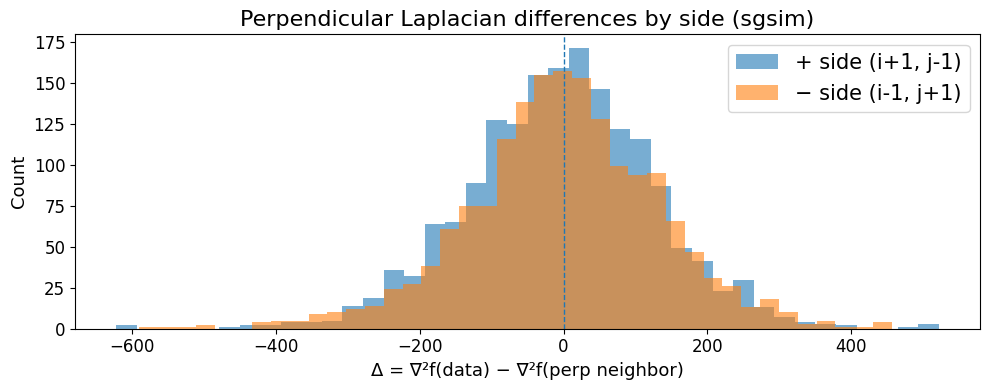

In [295]:
## PERPENDICULAR LAPLACIAN DIFFERENCES AT DATA LOCATIONS + HISTOGRAM ##
## ================================================================= ##

# Assumes:
# - laplacian: 2D array computed above (same shape as mat: (rows, cols))
# - extent = [xmin, xmax, ymin, ymax]
# - rows, cols
# - x_coords, y_coords are your data locations
# - For your Kriging plots you used origin='upper'; we map accordingly.

xmin, xmax, ymin, ymax = extent
dx_pix = (xmax - xmin) / (cols - 1)
dy_pix = (ymax - ymin) / (rows - 1)

def xy_to_ij(x, y):
    """Map world coords to array indices for an imshow(origin='upper') grid."""
    j = int(np.rint((x - xmin) / dx_pix))
    i = int(np.rint((ymax - y) / dy_pix))  # flip y -> row index (top = 0)
    # clip to bounds
    if j < 0 or j >= cols or i < 0 or i >= rows:
        return None
    return i, j

# Perpendicular to 45° lines → use diagonal neighbors (±1, ∓1)
perp_offsets = [(+1, -1), (-1, +1)]

diffs_all = []
diff_plus = []   # using (+1, -1)
diff_minus = []  # using (-1, +1)

for x, y in zip(x_coords, y_coords):
    idx = xy_to_ij(float(x), float(y))
    if idx is None:
        continue
    i, j = idx
    c = laplacian[i, j]
    if not np.isfinite(c):
        continue

    # (+1, -1)
    ii, jj = i + perp_offsets[0][0], j + perp_offsets[0][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_plus.append(d)

    # (-1, +1)
    ii, jj = i + perp_offsets[1][0], j + perp_offsets[1][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - laplacian[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_minus.append(d)

diffs_all_mgsimreal = np.asarray(diffs_all, dtype=float)
diff_plus  = np.asarray(diff_plus, dtype=float)
diff_minus = np.asarray(diff_minus, dtype=float)

# --- Histogram (combined) ---
plt.rcParams.update({
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diffs_all_mgsimreal, bins=40, alpha=0.9)
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences at data points (sgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/mgsimreal_laplacian_perp_diffs_hist.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()

# --- (Optional) Separate histograms for each side ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diff_plus,  bins=40, alpha=0.6, label="+ side (i+1, j-1)")
ax.hist(diff_minus, bins=40, alpha=0.6, label="− side (i-1, j+1)")
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences by side (sgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
ax.legend()
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/mgsimreal_laplacian_perp_diffs_hist_sides.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()


In [296]:
# ## PLOT THE GROUND TRUTH, MGSIM MEAN, AND MGSIM VAR RASTERS OVERLAID WITH FLIGHTLINES AND CLUSTER BOUNDARIES ##
# ## ========================================================================================================= ##

# # --- Build extent from ground-truth XY so plots align with real coords ---
# x_vals = gt_xyvc[:, 0].reshape(rows, cols)
# y_vals = gt_xyvc[:, 1].reshape(rows, cols)
# extent = [x_vals.min(), x_vals.max(), y_vals.min(), y_vals.max()]

# # If you don't already have these:
# vmin, vmax = -1000, 1500

# # --- Helper: plot contours (find_contours gave (row, col); map to (x, y) using extent) ---
# def _plot_contours_world(ax, contours_rc, rows, cols, extent, **kw):
#     xmin, xmax, ymin, ymax = extent
#     for c in contours_rc:
#         r = c[:, 0]
#         co = c[:, 1]
#         x = xmin + (co / (cols - 1)) * (xmax - xmin)
#         y = ymin + (r / (rows - 1)) * (ymax - ymin)
#         ax.plot(x, y, **kw)

# # =========================
# # (1) GROUND TRUTH MAP
# # =========================
# fig, ax = plt.subplots(figsize=(15, 6))
# rgb = ls.shade(ground_truth, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
# ax.imshow(rgb, origin='lower', extent=extent)

# # Colorbar that matches the colormap & range
# sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
# sm.set_array([])
# fig.colorbar(sm, ax=ax, shrink=0.6, label='Value')

# # Flightline locations (faint dots)
# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)

# # Contours between regions
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

# ax.set_title("Ground Truth + Flightlines + Region Boundaries")
# ax.set_xlabel("X")
# ax.set_ylabel("Y")
# plt.tight_layout()
# plt.show()


# # =========================
# # (2) MGSIM MEAN GRID
# # =========================
# fig, ax = plt.subplots(figsize=(15, 6))
# rgb = ls.shade(mean_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
# ax.imshow(rgb, origin='lower', extent=extent)

# sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
# sm.set_array([])
# fig.colorbar(sm, ax=ax, shrink=0.6, label='Value')

# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

# ax.set_title("MultiGrid Ensemble Mean + Flightlines + Region Boundaries")
# ax.set_xlabel("X")
# ax.set_ylabel("Y")
# plt.tight_layout()
# plt.show()


# # =========================
# # (3) MGSIM VARIANCE GRID
# # =========================
# variance_grid = var_grid

# # Choose variance color scaling; adjust as needed
# vmin_var, vmax_var = 0.0, float(np.nanpercentile(variance_grid, 98.5))

# fig, ax = plt.subplots(figsize=(15, 6))
# rgb = ls.shade(variance_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin_var, vmax=vmax_var)
# ax.imshow(rgb, origin='lower', extent=extent)

# sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin_var, vmax=vmax_var), cmap=geosoft_cmap)
# sm.set_array([])
# fig.colorbar(sm, ax=ax, shrink=0.6, label='Variance')

# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

# ax.set_title("MultiGrid Ensemble Variance + Flightlines + Region Boundaries")
# ax.set_xlabel("X")
# ax.set_ylabel("Y")
# plt.tight_layout()
# plt.show()


# # =========================
# # (4) LAPLACIAN OF ENSEMBLE MEAN
# # =========================

# # --- Laplacian (same lightshade + geosoft_cmap style) ---

# # spacing from your grid coords
# dx = float(np.median(np.diff(x_vals[0, :])))
# dy = float(np.median(np.diff(y_vals[:, 0])))

# def laplacian_2d(arr2d, dx, dy):
#     """5-point Laplacian (no wrap); edges set to NaN."""
#     lap = np.full(arr2d.shape, np.nan, dtype=float)
#     lap[1:-1, 1:-1] = (
#         (arr2d[1:-1, 2:]  - 2*arr2d[1:-1, 1:-1] + arr2d[1:-1, :-2]) / (dx*dx) +
#         (arr2d[2:, 1:-1]  - 2*arr2d[1:-1, 1:-1] + arr2d[:-2, 1:-1]) / (dy*dy)
#     )
#     return lap

# # if needed: ensure mean_grid is 2D
# if mean_grid.ndim == 1:
#     mean_grid = mean_grid.reshape(rows, cols)

# lap_mean = laplacian_2d(mean_grid, dx, dy)

# # symmetric color scaling around 0 (but same cmap & lightshade as others)
# amax = float(np.nanpercentile(np.abs(lap_mean), 99))
# vmin_lap, vmax_lap = -amax, amax

# fig, ax = plt.subplots(figsize=(15, 6))
# rgb = ls.shade(lap_mean, cmap=geosoft_cmap, blend_mode='soft',
#                vmin=vmin_lap, vmax=vmax_lap)
# ax.imshow(rgb, origin='lower', extent=extent)

# # colorbar that matches the colormap & range (same as earlier)
# sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin_lap, vmax=vmax_lap),
#                            cmap=geosoft_cmap)
# sm.set_array([])
# fig.colorbar(sm, ax=ax, shrink=0.6, label='Laplacian(Ensemble Mean)')

# # overlays: flightlines + contours
# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

# ax.set_title("Laplacian of MultiGrid Ensemble Mean + Flightlines + Region Boundaries")
# ax.set_xlabel("X"); ax.set_ylabel("Y")
# plt.tight_layout(); plt.show()


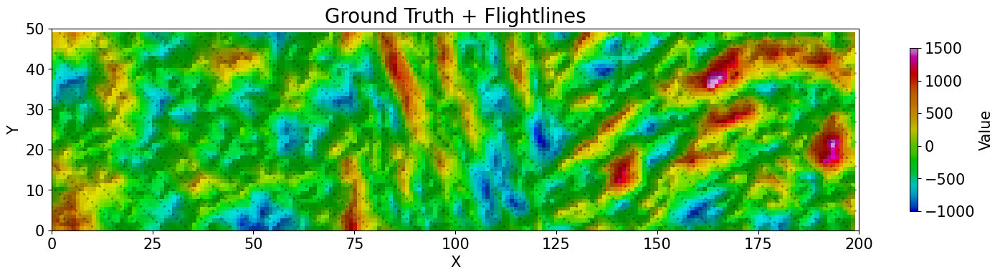

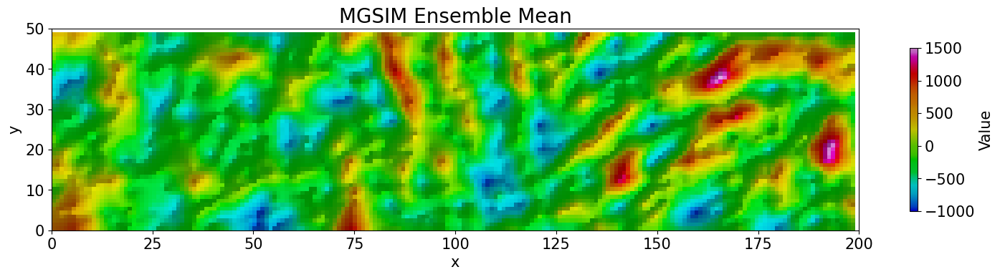

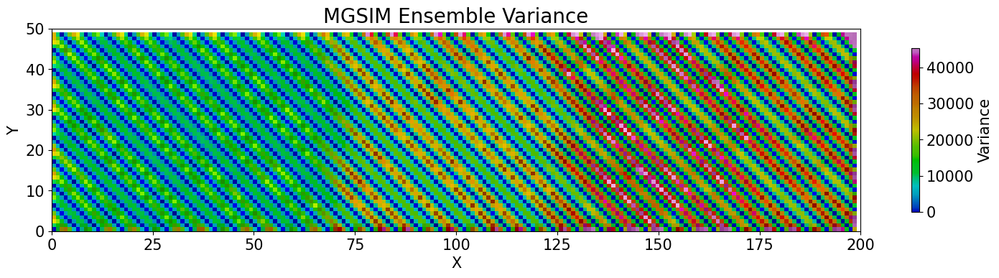

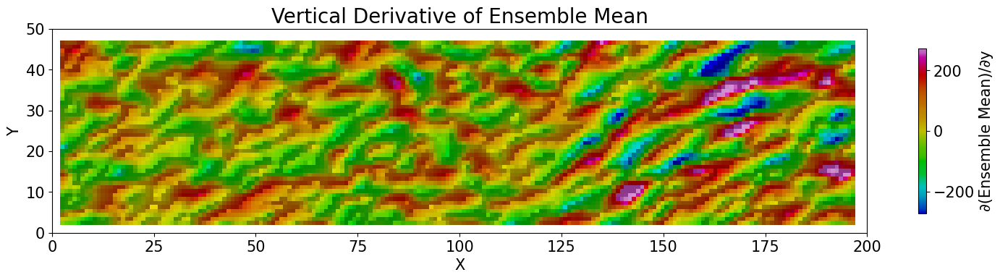

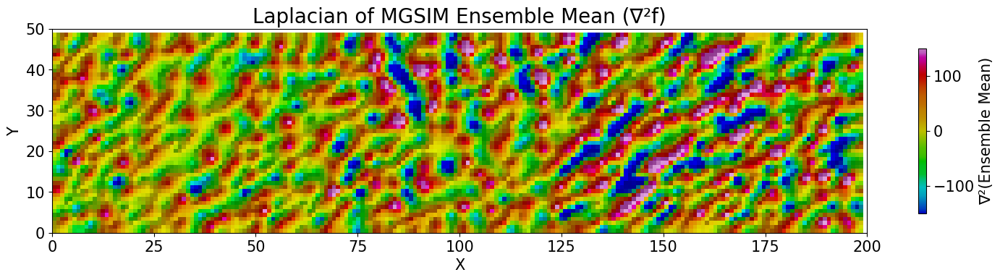

In [323]:
## PLOT THE GROUND TRUTH, MGSIM MEAN, AND MGSIM VAR RASTERS OVERLAID WITH FLIGHTLINES AND CLUSTER BOUNDARIES ##
## ========================================================================================================= ##

# --- Build extent from ground-truth XY so plots align with real coords ---
x_vals = gt_xyvc[:, 0].reshape(rows, cols)
y_vals = gt_xyvc[:, 1].reshape(rows, cols)
extent = [x_vals.min(), x_vals.max(), y_vals.min(), y_vals.max()]

# If you don't already have these:
vmin, vmax = -1000, 1500

# --- Helper: plot contours (find_contours gave (row, col); map to (x, y) using extent) ---
def _plot_contours_world(ax, contours_rc, rows, cols, extent, **kw):
    xmin, xmax, ymin, ymax = extent
    for c in contours_rc:
        r = c[:, 0]
        co = c[:, 1]
        x = xmin + (co / (cols - 1)) * (xmax - xmin)
        y = ymin + (r / (rows - 1)) * (ymax - ymin)
        ax.plot(x, y, **kw)

# =========================
# (1) GROUND TRUTH MAP
# =========================
plt.rcParams.update({
    "axes.titlesize": 20,
    "axes.labelsize": 15,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "legend.fontsize": 15,
})

fig, ax = plt.subplots(figsize=(15, 6))
rgb = ls.shade(ground_truth, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
ax.imshow(rgb, origin='lower', extent=extent)

# Colorbar that matches the colormap & range
sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
sm.set_array([])
fig.colorbar(sm, ax=ax, shrink=0.4, label='Value')

# Flightline locations (faint dots)
ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)

# Contours between regions
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

ax.set_title("Ground Truth + Flightlines")
ax.set_xlabel("X")
ax.set_ylabel("Y")

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

plt.tight_layout()
plt.show()


# =========================
# (2) MGSIM MEAN GRID
# =========================
fig, ax = plt.subplots(figsize=(15, 6))
rgb = ls.shade(mean_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin, vmax=vmax)
ax.imshow(rgb, origin='lower', extent=extent)

sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin, vmax=vmax), cmap=geosoft_cmap)
sm.set_array([])
fig.colorbar(sm, ax=ax, shrink=0.4, label='Value')

# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

ax.set_title("MGSIM Ensemble Mean")
ax.set_xlabel("x")
ax.set_ylabel("y")

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

plt.tight_layout()

# save clean image
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/grid_mgsim_mean.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()


# =========================
# (3) MGSIM VARIANCE GRID
# =========================
variance_grid = var_grid

# Choose variance color scaling; adjust as needed
vmin_var, vmax_var = 0.0, float(np.nanpercentile(variance_grid, 98.5))

fig, ax = plt.subplots(figsize=(15, 6))
rgb = ls.shade(variance_grid, cmap=geosoft_cmap, blend_mode='soft', vmin=vmin_var, vmax=vmax_var)
ax.imshow(rgb, origin='lower', extent=extent)

sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin_var, vmax=vmax_var), cmap=geosoft_cmap)
sm.set_array([])
fig.colorbar(sm, ax=ax, shrink=0.4, label='Variance')

# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

ax.set_title("MGSIM Ensemble Variance")
ax.set_xlabel("X")
ax.set_ylabel("Y")

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

plt.tight_layout()

# save clean image
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/grid_mgsim_var.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)


plt.show()


# =========================
# (4) VERTICAL DERIVATIVE OF ENSEMBLE MEAN
# =========================

# grid spacing from coords
dx = float(np.median(np.diff(x_vals[0, :])))
dy = float(np.median(np.diff(y_vals[:, 0])))

def d_dy_centered(arr2d, dy):
    """Centered first derivative in y; edges set to NaN to avoid artifacts."""
    d = np.full(arr2d.shape, np.nan, dtype=float)
    d[1:-1, 1:-1] = (arr2d[2:, 1:-1] - arr2d[:-2, 1:-1]) / (2.0 * dy)
    return d

# ensure mean_grid is 2D
if mean_grid.ndim == 1:
    mean_grid = mean_grid.reshape(rows, cols)

dmdy = d_dy_centered(mean_grid, dy)

# symmetric color scaling around 0 (robust)
amax = float(np.nanpercentile(np.abs(dmdy), 99))
vmin_dy, vmax_dy = -amax, amax

fig, ax = plt.subplots(figsize=(15, 6))
rgb = ls.shade(dmdy, cmap=geosoft_cmap, blend_mode='soft',
               vmin=vmin_dy, vmax=vmax_dy)
ax.imshow(rgb, origin='lower', extent=extent)

sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin_dy, vmax=vmax_dy),
                           cmap=geosoft_cmap)
sm.set_array([])
fig.colorbar(sm, ax=ax, shrink=0.4, label='∂(Ensemble Mean)/∂y')

# overlays: flightlines + region contours
# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

ax.set_title("Vertical Derivative of Ensemble Mean")
ax.set_xlabel("X"); ax.set_ylabel("Y")
# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
# ensure top limits (200, 50) are labeled
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))
plt.tight_layout(); 

# save clean image
plt.savefig(
    f"/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/grid_mgsim_mean_vertderiv.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)


plt.show()


# =========================
# (5) LAPLACIAN OF ENSEMBLE MEAN
# =========================

# ensure mean_grid is 2D (rows x cols)
if mean_grid.ndim == 1:
    mean_grid = mean_grid.reshape(rows, cols)

# reuse dx, dy from above (computed from x_vals, y_vals)
# dx = float(np.median(np.diff(x_vals[0, :])))
# dy = float(np.median(np.diff(y_vals[:, 0])))

# first derivatives
dmy, dmx = np.gradient(mean_grid, dy, dx)   # order: (∂/∂y, ∂/∂x)

# second derivatives
d2myy, _ = np.gradient(dmy, dy, dx)
_, d2mxx = np.gradient(dmx, dy, dx)

lap_mean = d2mxx + d2myy   # ∇²(mean)

# symmetric, robust color limits around 0
amax_lap = float(np.nanpercentile(np.abs(lap_mean), 99))
vmin_lap, vmax_lap = -150, 150

fig, ax = plt.subplots(figsize=(15, 6))
rgb = ls.shade(lap_mean, cmap=geosoft_cmap, blend_mode='soft',
               vmin=vmin_lap, vmax=vmax_lap)
ax.imshow(rgb, origin='lower', extent=extent)

sm = mpl.cm.ScalarMappable(norm=Normalize(vmin=vmin_lap, vmax=vmax_lap),
                           cmap=geosoft_cmap)
sm.set_array([])
fig.colorbar(sm, ax=ax, shrink=0.4, label='∇²(Ensemble Mean)')

# (optional) overlays
# ax.scatter(fl_xyvc[:, 0], fl_xyvc[:, 1], s=5, c='k', alpha=0.3, linewidth=0)
# _plot_contours_world(ax, [c for cs in contours_by_cluster.values() for c in cs],
#                      rows, cols, extent, linewidth=2, color='black', alpha=0.5)

ax.set_title("Laplacian of MGSIM Ensemble Mean (∇²f)")
ax.set_xlabel("X"); ax.set_ylabel("Y")

# force axes to match desired domain
ax.set_xlim(0, 200)
ax.set_ylim(0, 50)
ax.set_xticks(np.arange(0, 201, 25))
ax.set_yticks(np.arange(0, 51, 10))

plt.tight_layout()

# save clean image
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/grid_mgsim_mean_laplacian.png",
    dpi=300, bbox_inches="tight", pad_inches=0, transparent=True
)

plt.show()




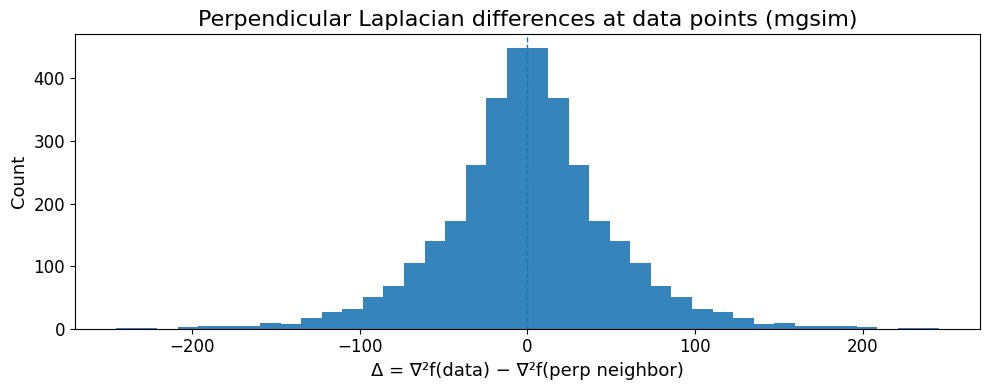

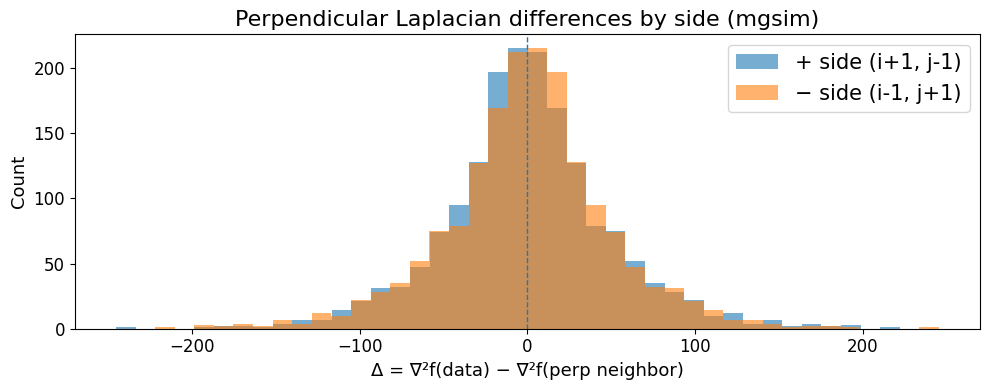

In [298]:
## PERPENDICULAR LAPLACIAN DIFFERENCES AT DATA LOCATIONS + HISTOGRAM ##
## ================================================================= ##

# Assumes:
# - laplacian: 2D array computed above (same shape as mat: (rows, cols))
# - extent = [xmin, xmax, ymin, ymax]
# - rows, cols
# - x_coords, y_coords are your data locations
# - For your Kriging plots you used origin='upper'; we map accordingly.

xmin, xmax, ymin, ymax = extent
dx_pix = (xmax - xmin) / (cols - 1)
dy_pix = (ymax - ymin) / (rows - 1)

def xy_to_ij(x, y):
    """Map world coords to array indices for an imshow(origin='upper') grid."""
    j = int(np.rint((x - xmin) / dx_pix))
    i = int(np.rint((ymax - y) / dy_pix))  # flip y -> row index (top = 0)
    # clip to bounds
    if j < 0 or j >= cols or i < 0 or i >= rows:
        return None
    return i, j

# Perpendicular to 45° lines → use diagonal neighbors (±1, ∓1)
# perp_offsets = [(+1, -1), (-1, +1)]
perp_offsets = [(+1, +1), (-1, -1)]


diffs_all = []
diff_plus = []   # using (+1, -1)
diff_minus = []  # using (-1, +1)

for x, y in zip(x_coords, y_coords):
    idx = xy_to_ij(float(x), float(y))
    if idx is None:
        continue
    i, j = idx
    c = lap_mean[i, j]
    if not np.isfinite(c):
        continue

    # (+1, -1)
    ii, jj = i + perp_offsets[0][0], j + perp_offsets[0][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - lap_mean[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_plus.append(d)

    # (-1, +1)
    ii, jj = i + perp_offsets[1][0], j + perp_offsets[1][1]
    if 0 <= ii < rows and 0 <= jj < cols:
        d = c - lap_mean[ii, jj]
        if np.isfinite(d):
            diffs_all.append(d)
            diff_minus.append(d)

diffs_all_mgsim = np.asarray(diffs_all, dtype=float)
diff_plus  = np.asarray(diff_plus, dtype=float)
diff_minus = np.asarray(diff_minus, dtype=float)

# --- Histogram (combined) ---
plt.rcParams.update({
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diffs_all_mgsim, bins=40, alpha=0.9)
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences at data points (mgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/mgsim_laplacian_perp_diffs_hist.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()

# --- (Optional) Separate histograms for each side ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(diff_plus,  bins=40, alpha=0.6, label="+ side (i+1, j-1)")
ax.hist(diff_minus, bins=40, alpha=0.6, label="− side (i-1, j+1)")
ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences by side (mgsim)")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Count")
ax.legend()
plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/mgsim_laplacian_perp_diffs_hist_sides.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()


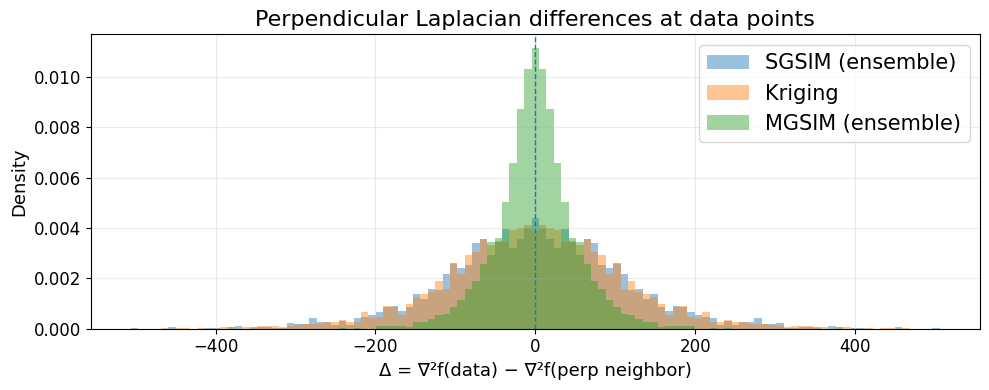

In [339]:
## OVERLAID HISTOGRAMS (SHADED): SGSIM · Kriging · MGSIM (one) · MGSIM (ensemble) ##
## ============================================================================= ##

import numpy as np

# 1) clean to finite 1D arrays (in the requested order)
d_sg  = np.asarray(diffs_all_sgsim,     dtype=float).ravel()
d_kr  = np.asarray(diffs_all_kriging,   dtype=float).ravel()
# d_mgr = np.asarray(diffs_all_mgsimreal, dtype=float).ravel()
d_mg  = np.asarray(diffs_all_mgsim,     dtype=float).ravel()

d_sg  = d_sg[np.isfinite(d_sg)]
d_kr  = d_kr[np.isfinite(d_kr)]
# d_mgr = d_mgr[np.isfinite(d_mgr)]
d_mg  = d_mg[np.isfinite(d_mg)]

datasets = [
    ("SGSIM (ensemble)", d_sg),
    ("Kriging",             d_kr),
    # ("MGSIM (one realiz.)", d_mgr),
    ("MGSIM (ensemble)",    d_mg),
]

# 2) shared bin edges from combined data
non_empty = [d for _, d in datasets if d.size]
if not non_empty:
    raise ValueError("All diff arrays are empty or non-finite.")
all_d = np.concatenate(non_empty)
edges = np.histogram_bin_edges(all_d, bins='auto')
# Optional robust fixed range:
# lo, hi = np.percentile(all_d, [1, 99])
# edges = np.linspace(lo, hi, 40)

# 3) plot (filled/shaded, no outlines)
plt.rcParams.update({
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
})
fig, ax = plt.subplots(figsize=(10, 4))

for label, data in datasets:
    if data.size:
        ax.hist(
            data, bins=edges, density=True,
            alpha=0.45, label=f"{label}",
            edgecolor='none'  # <- no outlines
        )

ax.axvline(0, linestyle='--', linewidth=1)
ax.set_title("Perpendicular Laplacian differences at data points")
ax.set_xlabel("Δ = ∇²f(data) − ∇²f(perp neighbor)")
ax.set_ylabel("Density")
ax.legend(loc="upper right")
ax.grid(True, alpha=0.25)

plt.tight_layout()
plt.savefig(
    "/Users/jrines/stanford_gp/research/mx/computers_geosciences/figures/sgsim_kriging_mgsimreal_mgsim_laplacian_perp_diffs_hist_filled.png",
    dpi=300, bbox_inches="tight", transparent=True
)
plt.show()


## Histograms

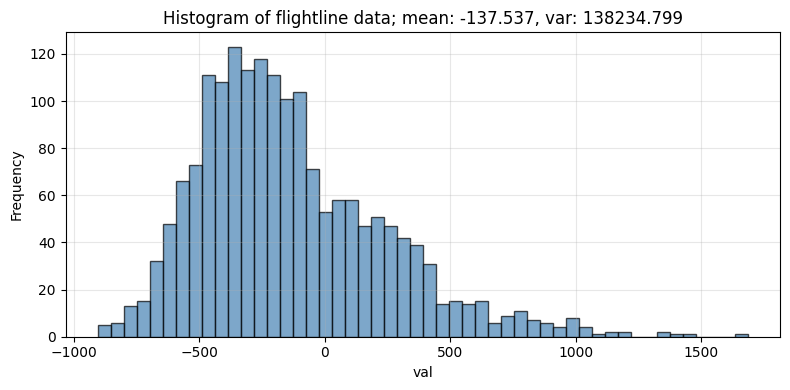

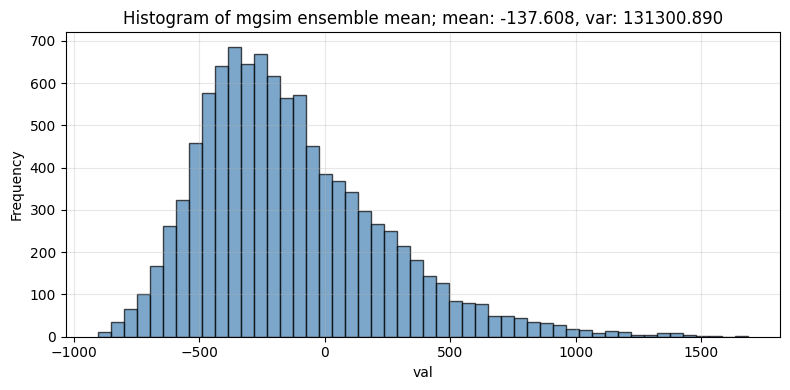

In [84]:
## HISTOGRAMS OF ORIGINAL FLIGHTLINE DATA AND MEAN MGSIM ENSEMBLE VALUES ##
## ===================================================================== ##

# Histogram of flightline data
plt.figure(figsize=(8, 4))
residuals = fl_xyvc[:, 2]
plt.hist(residuals, bins=50, color="steelblue", edgecolor="k", alpha=0.7)
plt.title(f"Histogram of flightline data; mean: {fl_xyvc[:,2].mean():.3f}, var: {fl_xyvc[:,2].var():.3f}")
plt.xlabel("val")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# Histogram of mgsim ensemble mean values
plt.figure(figsize=(8, 4))
plt.hist(mean_grid.flatten(), bins=50, color="steelblue", edgecolor="k", alpha=0.7)
plt.title(f"Histogram of mgsim ensemble mean; mean: {mean_grid.flatten().mean():.3f}, var: {mean_grid.flatten().var():.3f}")
plt.xlabel("val")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

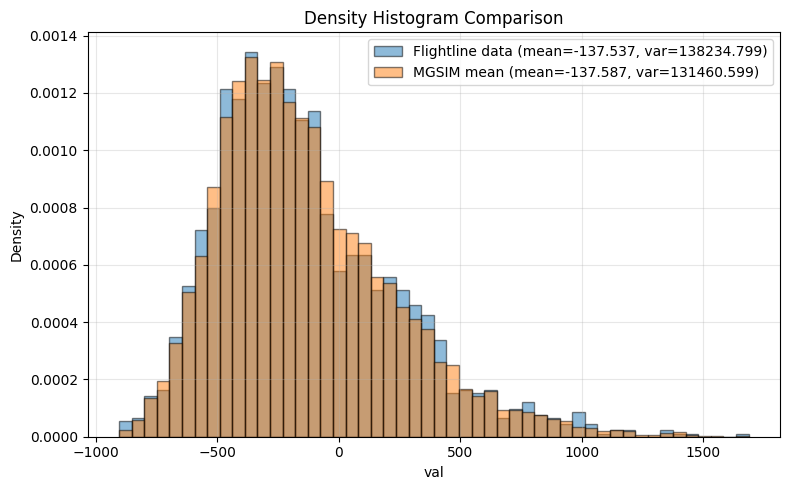

In [91]:
# Replace with your actual arrays
residuals = fl_xyvc[:, 2]
vals = mean_grid.flatten()

plt.figure(figsize=(8, 5))

# Flightline data
plt.hist(
    residuals,
    bins=50,
    density=True,
    alpha=0.5,
    edgecolor="k",
    label=f"Flightline data (mean={residuals.mean():.3f}, var={residuals.var():.3f})"
)

# MGSIM ensemble mean
plt.hist(
    vals,
    bins=50,
    density=True,
    alpha=0.5,
    edgecolor="k",
    label=f"MGSIM mean (mean={vals.mean():.3f}, var={vals.var():.3f})"
)

plt.title("Density Histogram Comparison")
plt.xlabel("val")
plt.ylabel("Density")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()